# Install package and import needed files

In [ ]:
!pip install statsforecast -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 344.8/344.8 kB 11.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 287.4/287.4 kB 9.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 278.2/278.2 kB 17.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 37.3/37.3 MB 27.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.0/41.0 kB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.3/62.3 kB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.3/135.3 kB 9.0 MB/s eta 0:00:00


In [ ]:
#Import necessary libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import time
import warnings
import statsmodels.api as sm
import random
import shap

from google.colab import drive
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.tsa.arima.model import ARIMA

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error

from statsforecast import StatsForecast
from statsforecast.models import AutoARIMA
from statsforecast.arima import arima_string, auto_arima_f

from xgboost import XGBRegressor

from enum import unique

from math import sqrt

warnings.filterwarnings("ignore")

# Determine number of items to be included and test

Due to extensive processing time, this parameters setup is to control number of products to be process for each algorthms. As the performance improved, number of items expected to increase.

In [ ]:
# Select number of items
num_of_items = 100

# Consume data files

Retrieve raw data file directly from Google Drive

In [ ]:
# Connect to google drive for data

# Mount Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Consume file and store in dataframe, check for exception
def consume_csv_file(file_path):
  try:
      df = pd.read_csv(file_path)
  except FileNotFoundError:
      print(f"File not found at path: {csv_file_path}")
  except Exception as e:
      print(f"Error reading CSV file: {e}")
  return df

In [ ]:
# Adjust PDay into date format. round QtyOrd into the next integer value
def date_format(df, column):
  df[column] = pd.to_datetime(df[column])
  return df

In [ ]:
# Consume file and basic data review

# Specify the path to your CSV file in Google Drive
csv_file_path = '/content/drive/MyDrive/Dataset/DemandData/DemandData_4.csv'

# Read data file
rawdata = consume_csv_file(csv_file_path)

# Adjust date column format
rawdata = date_format(rawdata, 'PDay')

# Add record count by group and item
rawdata['Group_Rec'] = rawdata.groupby(['Whse', 'Item'])['QtyOrd'].transform('count')
rawdata['Item_Rec'] = rawdata.groupby('Item')['Group_Rec'].transform('max')

In [ ]:
# Display Dataset / Data Frame Info
rawdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 317982 entries, 0 to 317981
Data columns (total 12 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   Whse         317982 non-null  object        
 1   Item         317982 non-null  object        
 2   ProdCat      317982 non-null  object        
 3   CompanyRank  317982 non-null  object        
 4   WhseRank     317982 non-null  object        
 5   PDay         317982 non-null  datetime64[ns]
 6   QtyOrd       317982 non-null  float64       
 7   Promo        317982 non-null  int64         
 8   DaysSSO      317982 non-null  int64         
 9   TimeSSO      317982 non-null  int64         
 10  Group_Rec    317982 non-null  int64         
 11  Item_Rec     317982 non-null  int64         
dtypes: datetime64[ns](1), float64(1), int64(5), object(5)
memory usage: 29.1+ MB


# Data Cleaning Process

Start of the data cleaning process. It included the initial cleaning at each product with location, with filling missing records in between months, update qty if stockout is flag, handle extreme outliers using IQR method with interpolate substitution method. Data is then aggregrated to company level, and re-process again. Each record being processed are flag, for the futue visualization display. Finally, products with leading zero qty months are removed, as item may not have introduced to the market, and these zero value will mislead the forecast model.

In [ ]:
# Review and fill the missing records in between months.  Mimic prodcat,
# company rank, whse rank for each groupset 0 for qtyord, daysstockout and
# timestockout column.

# The process begins with identify unique date range and group indexes, merge
# for all the possible combination.

def group_miss_fill(df):

  # Create a copy of the DataFrame to avoid modifying the original
  df = df.copy()

  # Fill missing 'ProdCat', 'CompanyRank', and 'WhseRank' before creating missing records
  # Use the first valid value within each 'Item' group to fill NaNs
  df['ProdCat'] = df.groupby('Item')['ProdCat'].transform(lambda x: x.fillna(method='ffill').fillna(method='bfill'))
  df['CompanyRank'] = df.groupby('Item')['CompanyRank'].transform(lambda x: x.fillna(method='ffill').fillna(method='bfill'))
  df['WhseRank'] = df.groupby('Item')['WhseRank'].transform(lambda x: x.fillna(method='ffill').fillna(method='bfill'))

  # Generate all possible dates within the range of the DataFrame
  all_dates = pd.date_range(start=df['PDay'].min(), end=df['PDay'].max(), freq='MS') # 'MS' for Month Start

  # Create a list to store DataFrames for each item's combinations
  all_combinations_list = []

  # Iterate through each unique item
  for item in df['Item'].unique():
      # Get the unique warehouses for the current item in the original data
      item_whses = df[df['Item'] == item]['Whse'].unique()

      # Create a MultiIndex from the unique warehouses for this item and the generated dates
      item_multi_index = pd.MultiIndex.from_product([item_whses, all_dates], names=['Whse', 'PDay'])

      # Create a DataFrame with this MultiIndex and add the Item column
      item_combinations_df = pd.DataFrame(index=item_multi_index).reset_index()
      item_combinations_df['Item'] = item

      # Append the combinations for this item to the list
      all_combinations_list.append(item_combinations_df)

  # Concatenate all the item combination DataFrames
  all_combinations_df = pd.concat(all_combinations_list, ignore_index=True)


  # Merge the original DataFrame with the DataFrame containing all combinations
  # This will bring in existing records and create NaNs for missing combinations
  merged_df = pd.merge(all_combinations_df, df, on=['Whse', 'Item', 'PDay'], how='left')

  # Identify rows with missing values in 'Qtyord' (these are the missing records)
  missing_records = merged_df[merged_df['QtyOrd'].isna()].copy()

  # Fill NaNs in ProdCat, CompanyRank, WhseRank for the newly created missing records
  # Use forward fill then backward fill within the missing records group
  missing_records['ProdCat'] = missing_records.groupby(['Whse', 'Item'])['ProdCat'].transform(lambda x: x.fillna(method='ffill').fillna(method='bfill'))
  missing_records['CompanyRank'] = missing_records.groupby(['Whse', 'Item'])['CompanyRank'].transform(lambda x: x.fillna(method='ffill').fillna(method='bfill'))
  missing_records['WhseRank'] = missing_records.groupby(['Whse', 'Item'])['WhseRank'].transform(lambda x: x.fillna(method='ffill').fillna(method='bfill'))


  # Set 'Qtyord', 'DaysStockOut', and 'TimeStockOut' to 0 for the missing records
  missing_records['QtyOrd'] = 0
  missing_records['DaysSSO'] = 0
  missing_records['TimeSSO'] = 0
  missing_records['Group_Rec'] = 0 # Set group record to 0 as it's a new record
  missing_records['Item_Rec'] = 0 # Set item record to 0 as it's a new record


  # Append the newly created missing records to the original DataFrame
  # Drop the rows with NaNs in Qtyord from the merged_df to avoid duplication
  df_filled = merged_df.dropna(subset=['QtyOrd']).copy()

  # Append the missing records
  df_filled = pd.concat([df_filled, missing_records], ignore_index=True)

  # Sort the DataFrame by Whse, Item, and PDay for better organization and reset index
  df_filled = df_filled.sort_values(by=['Whse', 'Item', 'PDay']).reset_index(drop=True)

  return df_filled, missing_records

In [ ]:
# Check for any record with QtyOrd = 0. When occur, check if DaysSSO > 0 or TimesSSO > 0.  If so, update the QtyOrd record using linear interpolation.
# Add a column in the dataframe as a flag for this update.

def group_anomaly_fill(df):

  # Create a copy of the DataFrame to avoid modifying the original
  df_filled = df.copy()

  # Ensure QtyOrd is float for interpolation
  df_filled['QtyOrd'] = df_filled['QtyOrd'].astype(float)

  # Identify rows to potentially update (QtyOrd == 0 and (DaysSSO > 0 or TimeSSO > 0))
  update_mask = (df_filled['QtyOrd'] == 0) & ((df_filled['DaysSSO'] > 0) | (df_filled['TimeSSO'] > 0))

  # Create a flag column, initially False
  df_filled['Updated_QtyOrd'] = False

  # Create a temporary series with the original 'QtyOrd' values
  temp_qty = df_filled['QtyOrd'].copy()

  # Set the 'QtyOrd' to NaN for the rows that need updating so interpolate can fill them
  temp_qty[update_mask] = np.nan

  # Apply linear interpolation to the temporary series within each group ('Whse', 'Item')
  interpolated_qty = temp_qty.groupby([df_filled['Whse'], df_filled['Item']]).transform(lambda x: x.interpolate(method='linear', limit_direction='both'))

  # Update the original DataFrame with the interpolated values for the specific rows
  df_filled.loc[update_mask, 'QtyOrd'] = interpolated_qty[update_mask]

  # Set the flag to True for the updated rows
  df_filled.loc[update_mask, 'Updated_QtyOrd'] = True

  # Ensure QtyOrd remains an integer by rounding up after interpolation
  df_filled['QtyOrd'] = np.ceil(df_filled['QtyOrd']).astype(int)

  return df_filled

In [ ]:
# Data Cleaning

# Fill missing time-series, default value to 0 and copy attributes
rawdata, group_miss_fill_process = group_miss_fill(rawdata)

# Review process by filled info
print('\nFilled missing time-series record')
group_miss_fill_process


Filled missing time-series record


,Whse,PDay,Item,ProdCat,CompanyRank,WhseRank,QtyOrd,Promo,DaysSSO,TimeSSO,Group_Rec,Item_Rec


In [ ]:
# process to fill for anomaly, which has 0 demand due to stock out
rawdata = group_anomaly_fill(rawdata)

# Review process by filled info
print('\nFilled anomaly record')
rawdata[rawdata['Updated_QtyOrd'] == True]


Filled anomaly record


,Whse,PDay,Item,ProdCat,CompanyRank,WhseRank,QtyOrd,Promo,DaysSSO,TimeSSO,Group_Rec,Item_Rec,Updated_QtyOrd
155,CH,2024-06-01,Prod1000,L,A,A,3,0,30,0,42,42,True
188,CH,2023-09-01,Prod1001,L,A,A,3,0,30,0,42,42,True
230,CH,2023-09-01,Prod1002,L,A,B,2,0,30,0,42,42,True
231,CH,2023-10-01,Prod1002,L,A,B,2,0,31,0,42,42,True
247,CH,2025-02-01,Prod1002,L,A,B,1,0,1,0,42,42,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...
317835,TX,2023-10-01,Prod996,L,A,A,2,0,1,0,42,42,True
317836,TX,2023-11-01,Prod996,L,A,A,2,0,30,0,42,42,True
317847,TX,2024-10-01,Prod996,L,A,A,9,0,17,1,42,42,True
317853,TX,2025-04-01,Prod996,L,A,A,4,0,9,1,42,42,True


In [ ]:
# review for unique record of product cateogry
print(rawdata['ProdCat'].unique())

['D' 'L' 'O' 'B' 'E']


In [ ]:
# Define a dictionary to map current values to definitions
prodcat_mapping = {
    'L': 'Living',
    'O': 'Office',
    'B': 'Bedroom',
    'E': 'Entryway',
    'D': 'Dining'
}

# Replace values in the 'ProdCat' column using the mapping
rawdata['ProdCat'] = rawdata['ProdCat'].replace(prodcat_mapping)

# Display the updated unique values to verify the changes
print(rawdata['ProdCat'].unique())

['Dining' 'Living' 'Office' 'Bedroom' 'Entryway']


In [ ]:
# Check number of unique Item per ProdCat
unique_items_per_prodcat = rawdata.groupby('ProdCat')['Item'].nunique()
print(unique_items_per_prodcat)

ProdCat
Bedroom     489
Dining      397
Entryway     84
Living      427
Office      127
Name: Item, dtype: int64


In [ ]:
# Taking a dataframe, group columns, and a select column to check for outliers
# using IQR method; when found, treat with interpolate method
# return treated dataframe

def group_iqr_outlier_treatment(df, group_cols, value_col, value_col2):

  df_treated = df.copy()
  df_treated['Outlier_flag'] = False

  for _, group in df_treated.groupby(group_cols):
    Q1 = group[value_col].quantile(0.25)
    Q3 = group[value_col].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outlier_mask = (group[value_col] < lower_bound) | (group[value_col] > upper_bound)

    if outlier_mask.any():
        # Store indices of outliers to update the flag later
        outlier_indices = group.loc[outlier_mask].index

        # Store original values for ratio calculation
        org_qty = group.loc[outlier_indices, value_col].copy()
        org_promo = group.loc[outlier_indices, value_col2].copy()


        # Set outliers to NaN for interpolation
        df_treated.loc[outlier_indices, value_col] = np.nan
        df_treated.loc[outlier_indices, value_col2] = np.nan # Set outlier Promo to NaN

        # Apply linear interpolation to the temporary series within the group
        df_treated.loc[group.index, value_col] = df_treated.loc[group.index, value_col].interpolate(method='linear', limit_direction='both')

        # Calculate the ratio of interpolated value to original value only for the outlier indices
        # Handle cases where org_qty is zero to avoid division by zero
        ratio = np.where(org_qty != 0, df_treated.loc[outlier_indices, value_col] / org_qty, np.nan)

        # Apply the ratio to the original Promo values for the outlier indices
        # Ensure the result is not NaN or infinity and is at least 0
        adjusted_promo = org_promo * ratio
        df_treated.loc[outlier_indices, value_col2] = np.maximum(0, adjusted_promo.fillna(0)) # Fill NaN with 0 and ensure minimum is 0


        # Set the outlier flag for the original outlier indices
        df_treated.loc[outlier_indices, 'Outlier_flag'] = True

  # Ensure the value column remains an integer by rounding up after interpolation
  df_treated[value_col] = np.ceil(df_treated[value_col]).astype(int)
  # Ensure the value column remains an integer by rounding up after interpolation, handle potential NaNs
  df_treated[value_col2] = df_treated[value_col2].apply(lambda x: np.ceil(x).astype(int) if pd.notna(x) else x)


  # Reset index before returning
  df_treated = df_treated.reset_index(drop=True)

  return df_treated

In [ ]:
# Apply the function to the rawdata DataFrame
group_outliner_treated = group_iqr_outlier_treatment(rawdata, ['Whse', 'Item'], 'QtyOrd','Promo')

# Display rows where outliers were flagged
print('\nRecords with Outlier Flag:')
group_outliner_treated[group_outliner_treated['Outlier_flag'] == True]


Records with Outlier Flag:


,Whse,PDay,Item,ProdCat,CompanyRank,WhseRank,QtyOrd,Promo,DaysSSO,TimeSSO,Group_Rec,Item_Rec,Updated_QtyOrd,Outlier_flag
42,CH,2022-01-01,Prod10,Dining,B,A,7,0,0,0,42,42,False,True
43,CH,2022-02-01,Prod10,Dining,B,A,7,0,0,0,42,42,False,True
76,CH,2024-11-01,Prod10,Dining,B,A,5,0,0,0,42,42,False,True
152,CH,2024-03-01,Prod1000,Living,A,A,2,0,0,0,42,42,False,True
183,CH,2023-04-01,Prod1001,Living,A,A,1,0,0,0,42,42,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
317818,TX,2022-05-01,Prod996,Living,A,A,3,0,0,0,42,42,False,True
317846,TX,2024-09-01,Prod996,Living,A,A,1,0,1,0,42,42,False,True
317847,TX,2024-10-01,Prod996,Living,A,A,1,0,17,1,42,42,True,True
317848,TX,2024-11-01,Prod996,Living,A,A,1,0,0,0,42,42,False,True


In [ ]:
# Function to check if column = 0 and (DaysSSO >0 or TimeSSO >0), then replace column value by perform interpolated method). Add the flag in the dataframe as "SSO_flag" and set to true for treated value; return dataframe

def fill_sso_anomalies(df, group_cols, value_col):

  # Copy data frame for process
  df_treated = df.copy()

  # Ensure the value column is float for interpolation
  df_treated[value_col] = df_treated[value_col].astype(float)

  # Identify rows to potentially update (value_col == 0 and (DaysSSO > 0 or TimeSSO > 0))
  update_mask = (df_treated[value_col] == 0) & ((df_treated['DaysSSO'] > 0) | (df_treated['TimeSSO'] > 0))

  # Create a flag column, initially False
  df_treated['SSO_flag'] = False

  # Create a temporary series with the original 'value_col' values
  temp_values = df_treated[value_col].copy()

  # Set the 'value_col' to NaN for the rows that need updating so interpolate can fill them
  temp_values[update_mask] = np.nan

  # Apply linear interpolation to the temporary series within each group
  interpolated_values = df_treated.groupby(group_cols)[value_col].transform(lambda x: x.interpolate(method='linear', limit_direction='both'))

  # Update the original DataFrame with the interpolated values for the specific rows
  df_treated.loc[update_mask, value_col] = interpolated_values[update_mask]

  # Set the flag to True for the updated rows
  df_treated.loc[update_mask, 'SSO_flag'] = True

  # Ensure the value column remains an integer by rounding up after interpolation
  # Only convert to integer if the interpolated value is not NaN (which happens if interpolation fails)
  df_treated.loc[update_mask, value_col] = df_treated.loc[update_mask, value_col].apply(lambda x: np.ceil(x).astype(int) if pd.notna(x) else x)

  return df_treated

In [ ]:
# Fill missing value based on stock out flags
group_sso_filled = fill_sso_anomalies(group_outliner_treated, ['Whse', 'Item'], 'QtyOrd')

# Display rows where SSO anomalies were treated
print('\nRecords with SSO Flag:')
group_sso_filled[group_sso_filled['SSO_flag'] == True]


Records with SSO Flag:


,Whse,PDay,Item,ProdCat,CompanyRank,WhseRank,QtyOrd,Promo,DaysSSO,TimeSSO,Group_Rec,Item_Rec,Updated_QtyOrd,Outlier_flag,SSO_flag
482,CH,2023-09-01,Prod1008,Living,A,B,0.0,0,30,0,42,42,True,False,True
483,CH,2023-10-01,Prod1008,Living,A,B,0.0,0,10,1,42,42,True,False,True
838,CH,2025-05-01,Prod1015,Living,A,A,0.0,0,1,0,42,42,True,False,True
839,CH,2025-06-01,Prod1015,Living,A,A,0.0,0,12,1,42,42,True,False,True
880,CH,2025-05-01,Prod1016,Living,A,A,0.0,0,1,0,42,42,True,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
310278,TX,2024-01-01,Prod833,Bedroom,D,E,0.0,0,31,0,42,42,True,True,True
313989,TX,2025-04-01,Prod912,Living,A,A,0.0,0,0,1,42,42,True,False,True
314266,TX,2023-11-01,Prod919,Living,A,B,0.0,0,13,1,42,42,True,False,True
314284,TX,2025-05-01,Prod919,Living,A,B,0.0,0,1,0,42,42,True,False,True


In [ ]:
# A method to take 2 dataframe, a defined colum and selected sample value, to display the pre- and post- cleaned data.

def display_and_chart_anomalies(df1=rawdata, df2=group_sso_filled, column="Outlier_flag", value=3):

  # Find groups with the specified anomaly flag in df2
  anomalous_groups = list(df2[df2[column]].groupby(['Whse', 'Item']).groups.keys())

  if not anomalous_groups:
    print(f"No groups found with '{column}' set to True in df2.")
    return

  # Convert the list of tuples into a list of strings for np.random.choice
  anomalous_groups_str = [f"{whse},{item}" for whse, item in anomalous_groups]

  # Randomly select a specified number of anomalous groups (as strings)
  num_groups_to_select = min(value, len(anomalous_groups_str))
  selected_groups_str = np.random.choice(anomalous_groups_str, size=num_groups_to_select, replace=False)

  print(f"\nDisplaying data and charts for {num_groups_to_select} randomly selected groups with '{column}' == True:")

  for group_str in selected_groups_str:
    # Split the string back into Whse and Item
    whse, item = group_str.split(',')
    print(f"\nGroup: Whse={whse}, Item={item}")

    # Filter data for the selected group from both dataframes
    group_df1 = df1[(df1['Whse'] == whse) & (df1['Item'] == item)].sort_values(by='PDay').reset_index(drop=True)
    group_df2 = df2[(df2['Whse'] == whse) & (df2['Item'] == item)].sort_values(by='PDay').reset_index(drop=True)

    # Chart the QtyOrd values
    plt.figure(figsize=(10, 5))

    # Line chart for treated data (df2)
    sns.lineplot(data=group_df2, x='PDay', y='QtyOrd', label='Treated', color = "Blue")

    # Scatter chart for original data (df1)
    sns.scatterplot(data=group_df1, x='PDay', y='QtyOrd', label='Original', color = "Red")

    plt.title(f'QtyOrd Over Time for Whse={whse}, Item={item}')
    plt.xlabel('Date')
    plt.ylabel('Quantity Ordered')
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


Displaying data and charts for 3 randomly selected groups with 'Outlier_flag' == True:

Group: Whse=NJ, Item=Prod1119


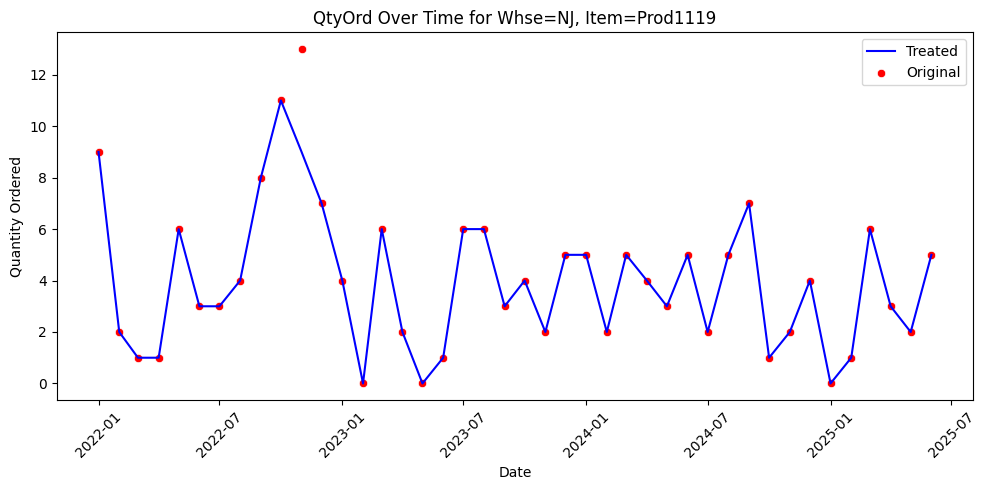


Group: Whse=CH, Item=Prod1004


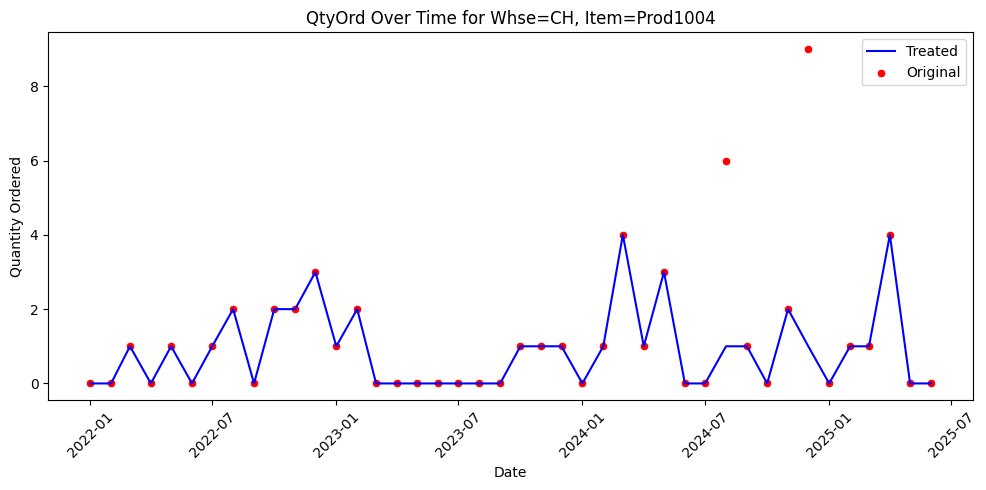


Group: Whse=LD, Item=Prod123


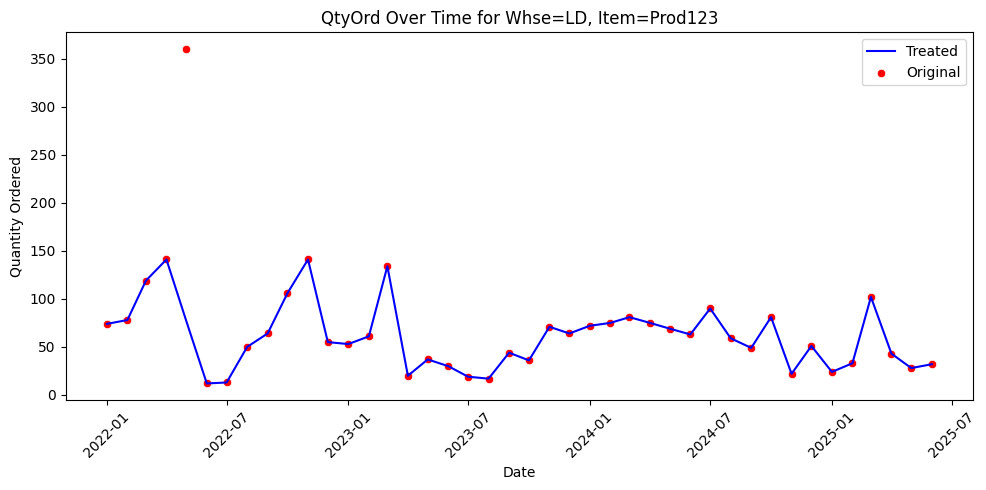

In [ ]:
# Display sample of treated outlier records

display_and_chart_anomalies()

In [ ]:
# Fill missing ProdCat and CompankRank
def fill_ProdCat_CompanyRank(df):
  df['Prodcat'] = df.groupby('Item')['ProdCat'].transform(lambda x: x.fillna(method='ffill').fillna(method='bfill'))
  df['CompanyRank'] = df.groupby('Item')['CompanyRank'].transform(lambda x: x.fillna(method='ffill').fillna(method='bfill'))
  return df

In [ ]:
# Aggregrate dataframe based on columns
def agg_company_by_columns(df, columns, value):
    return df.groupby(columns)[value].sum().reset_index()

# Roll up data to company level, clean again.

In [ ]:
# Aggregate data to company level

group_sso_filled = fill_ProdCat_CompanyRank(group_sso_filled)
company_data = agg_company_by_columns(group_sso_filled, ['Item', 'ProdCat','CompanyRank','PDay'], ['QtyOrd','Promo'])
company_data = company_data[['Item','ProdCat','CompanyRank','PDay','QtyOrd','Promo']]

In [ ]:
# Treat outlier at aggreated, company level

def company_data_iqr_outlier_treatment(df):

    # Reuse the group_iqr_outlier_treatment function
    # The group_cols for company_data based on the task description is ['Item']
    treated_df = group_iqr_outlier_treatment(df, ['Item'], 'QtyOrd','Promo')

    # Rename the default 'Outlier_flag' column to 'Company_Outlier_flag'
    treated_df = treated_df.rename(columns={'Outlier_flag': 'Company_Outlier_flag'})

    return treated_df

In [ ]:
# Apply the function to the company_data DataFrame
company_data_treated = company_data_iqr_outlier_treatment(company_data)

In [ ]:
# A method to take 2 dataframe, a defined colum and selected value, to display the pre- and post- cleaned data.

def company_display_and_chart_anomalies(df1=company_data, df2=company_data_treated, column="Company_Outlier_flag", value=3):

  # Find groups with the specified anomaly flag in df2
  anomalous_groups = list(df2[df2[column]].groupby(['Item']).groups.keys())

  if not anomalous_groups:
    print(f"No groups found with '{column}' set to True in df2.")
    return

  # Convert the list of tuples into a list of strings for np.random.choice
  anomalous_groups_str = [f"{item}" for item in anomalous_groups]

  # Randomly select a specified number of anomalous groups (as strings)
  num_groups_to_select = min(value, len(anomalous_groups_str))
  selected_groups_str = np.random.choice(anomalous_groups_str, size=num_groups_to_select, replace=False)

  print(f"\nDisplaying data and charts for {num_groups_to_select} randomly selected groups with '{column}' == True:")

  for group_str in selected_groups_str:
    # Extract the item from the string
    item = group_str
    print(f"\nGroup: Item = {item}")

    # Filter data for the selected group from both dataframes
    group_df1 = df1[(df1['Item'] == item)].sort_values(by='PDay').reset_index(drop=True)
    group_df2 = df2[(df2['Item'] == item)].sort_values(by='PDay').reset_index(drop=True)

    # Chart the QtyOrd values
    plt.figure(figsize=(10, 5))

    # Line chart for treated data (df2)
    sns.lineplot(data=group_df2, x='PDay', y='QtyOrd', label='Treated', color = "Blue")

    # Scatter chart for original data (df1)
    sns.scatterplot(data=group_df1, x='PDay', y='QtyOrd', label='Original', color = "Red")

    plt.title(f'QtyOrd Over Time for Item={item}')
    plt.xlabel('Date')
    plt.ylabel('Quantity Ordered')
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


Displaying data and charts for 3 randomly selected groups with 'Company_Outlier_flag' == True:

Group: Item = Prod743


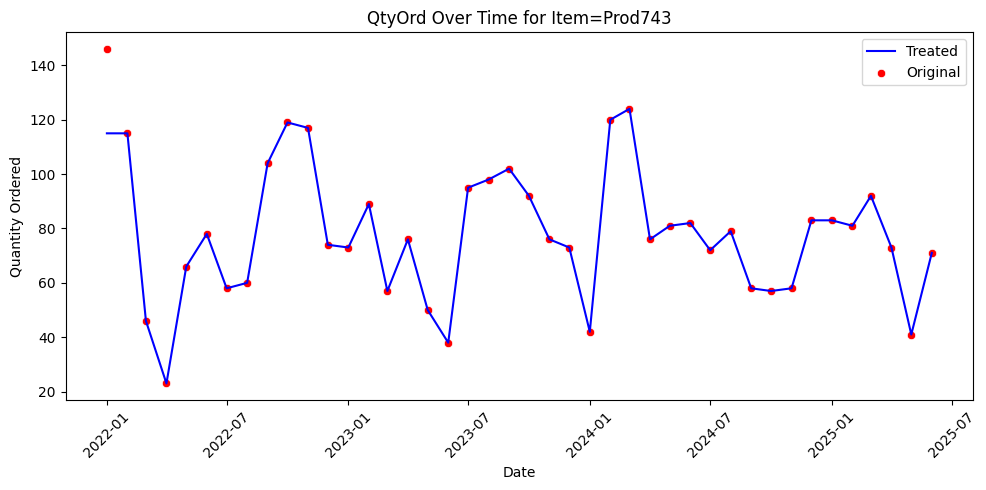


Group: Item = Prod949


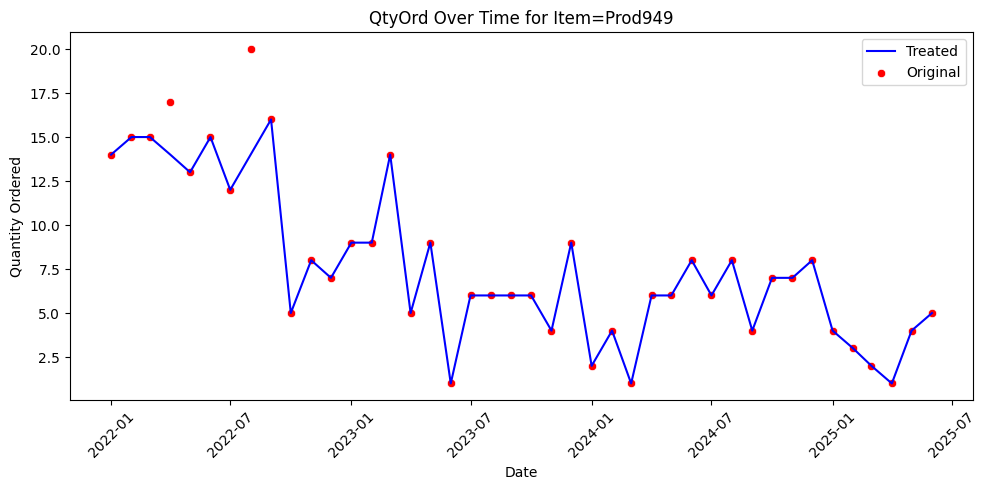


Group: Item = Prod1054


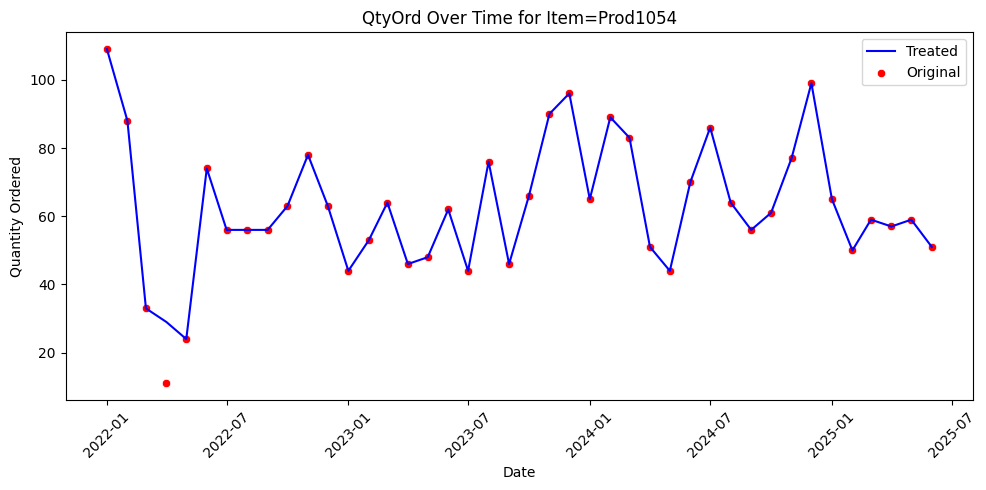

In [ ]:
# Display sample of company level treated records
company_display_and_chart_anomalies()

In [ ]:
# Identify initial PDay period with non-zero QtyOrd

def find_first_nonzero_pday(df, item_value):

  # Filter the DataFrame for the specific item
  item_df = df[df['Item'] == item_value].copy()

  # Sort the filtered DataFrame by PDay
  item_df = item_df.sort_values(by='PDay')

  # Find the first row where QtyOrd is non-zero
  first_nonzero_row = item_df[item_df['QtyOrd'] != 0].iloc[0] if not item_df[item_df['QtyOrd'] != 0].empty else None

  # Return the PDay from that row
  if first_nonzero_row is not None:
    return first_nonzero_row['PDay']
  else:
    return None


In [ ]:
# Identify items data which leading zero month, remove them from our analysis

def truncate_data_before_first_nonzero_pday(df):

  processed_df = pd.DataFrame()

  # Get the unique items in the DataFrame
  unique_items = df['Item'].unique()

  for item in unique_items:
    # Find the first non-zero PDay for the current item
    first_nonzero_date = find_first_nonzero_pday(df, item)

    if first_nonzero_date is not None:
      # Filter the original DataFrame to keep records for the current item
      item_df = df[df['Item'] == item].copy()
      # Keep only the records from the first non-zero date onwards
      truncated_item_df = item_df[item_df['PDay'] >= first_nonzero_date]
      # Concatenate the processed item data to the result DataFrame
      processed_df = pd.concat([processed_df, truncated_item_df], ignore_index=True)
    else:
      # If no non-zero PDay is found for an item, keep all its records or none
      # based on your requirement. Here, we'll keep all records if no non-zero
      # PDay is found (you might want to adjust this logic).
      item_df = df[df['Item'] == item].copy()
      processed_df = pd.concat([processed_df, item_df], ignore_index=True)

  # Ensure the resulting DataFrame is sorted and has a clean index
  processed_df = processed_df.sort_values(by=['Item', 'PDay']).reset_index(drop=True)

  return processed_df


In [ ]:
# Remove items with months that leading records with zero qty
truncated_company_data = truncate_data_before_first_nonzero_pday(company_data_treated)

# print("\nOriginal DataFrame head:")
print(company_data_treated.head())

# print("\nTruncated DataFrame head:")
print(truncated_company_data.head())

    Item ProdCat CompanyRank       PDay  QtyOrd  Promo  Company_Outlier_flag
0  Prod1  Dining           A 2022-01-01      45      0                 False
1  Prod1  Dining           A 2022-02-01      21      0                 False
2  Prod1  Dining           A 2022-03-01      34      0                 False
3  Prod1  Dining           A 2022-04-01       0      0                 False
4  Prod1  Dining           A 2022-05-01      11      0                 False
    Item ProdCat CompanyRank       PDay  QtyOrd  Promo  Company_Outlier_flag
0  Prod1  Dining           A 2022-01-01      45      0                 False
1  Prod1  Dining           A 2022-02-01      21      0                 False
2  Prod1  Dining           A 2022-03-01      34      0                 False
3  Prod1  Dining           A 2022-04-01       0      0                 False
4  Prod1  Dining           A 2022-05-01      11      0                 False


# EDA Process

The EDA process is to understand and evaluate the dataset. To understand the content of information and breakdown. These information can aid in final analysis for any insights. An additional review at this stage is to ensure the included items have between 30 months to 42 months of data; Too less will not be sufficient for modeling algorithm, too many will represent a logic issue during data cleaning process, as the maximum month the initial dataset contains maximum of 42 months of record. A review of each item trend and seasonality using statistical method is included, to gain information about the data behavior.

In [ ]:
# To review and verify sufficient data point for training

# Group by Item and count the number of records for each item
item_record_counts = truncated_company_data.groupby('Item').size().reset_index(name='Record_Count')

# Count the frequency of each unique record count
record_count_frequency = item_record_counts['Record_Count'].value_counts().reset_index(name='Frequency')

# Rename the columns for clarity
record_count_frequency.columns = ['Unique_Record_Count', 'Number_of_Items']

# Sort by the unique record count
record_count_frequency_sorted = record_count_frequency.sort_values(by='Unique_Record_Count')

print("\nFrequency of unique record counts per item:")
record_count_frequency_sorted


Frequency of unique record counts per item:


,Unique_Record_Count,Number_of_Items
6,30,4
10,32,2
11,33,2
9,34,3
4,35,13
2,36,18
8,37,3
7,38,4
3,39,18
5,40,11


In [ ]:
# Count the number of unique items per ProdCat
prodcat_item_counts = truncated_company_data.groupby('ProdCat')['Item'].nunique().reset_index(name='Unique_Item_Count')

# Display the result
print("\nUnique Item Count per ProdCat:")
display(prodcat_item_counts)


Unique Item Count per ProdCat:


,ProdCat,Unique_Item_Count
0,Bedroom,489
1,Dining,397
2,Entryway,84
3,Living,427
4,Office,127


In [ ]:
# Count the number of unique items per CompanyRank
company_rank_item_counts = truncated_company_data.groupby('CompanyRank')['Item'].nunique().reset_index(name='Unique_Item_Count')

# Display the result
print("\nUnique Item Count per CompanyRank:")
display(company_rank_item_counts)


Unique Item Count per CompanyRank:


,CompanyRank,Unique_Item_Count
0,A,1105
1,B,257
2,C,138
3,D,24


In [ ]:
# Count the number of unique items per combined ProdCat and CompanyRank group
combined_item_counts = truncated_company_data.groupby(['ProdCat', 'CompanyRank'])['Item'].nunique().reset_index(name='Unique_Item_Count')

# Display the result
print("\nUnique Item Count per ProdCat and CompanyRank:")
display(combined_item_counts)


Unique Item Count per ProdCat and CompanyRank:


,ProdCat,CompanyRank,Unique_Item_Count
0,Bedroom,A,359
1,Bedroom,B,71
2,Bedroom,C,43
3,Bedroom,D,16
4,Dining,A,309
5,Dining,B,47
6,Dining,C,38
7,Dining,D,3
8,Entryway,A,45
9,Entryway,B,28


In [ ]:
# Group by ProdCat, CompanyRank, and Item to get the total QtyOrd for each item in each group
item_qtyord_summary = truncated_company_data.groupby(['ProdCat', 'CompanyRank', 'Item'])['QtyOrd'].sum().reset_index()

# Now group by ProdCat and CompanyRank to get the min, max, and mean of the total QtyOrd for items within each group
group_qtyord_summary = item_qtyord_summary.groupby(['ProdCat', 'CompanyRank'])['QtyOrd'].agg(['min', 'max', 'mean']).reset_index()

# Rename the columns for clarity
group_qtyord_summary.columns = ['ProdCat', 'CompanyRank', 'Min_Total_QtyOrd', 'Max_Total_QtyOrd', 'Mean_Total_QtyOrd']

# Display the result
print("\nSummary of Total QtyOrd per Item within ProdCat and CompanyRank Groups (Min, Max, Mean):")
display(group_qtyord_summary)


Summary of Total QtyOrd per Item within ProdCat and CompanyRank Groups (Min, Max, Mean):


,ProdCat,CompanyRank,Min_Total_QtyOrd,Max_Total_QtyOrd,Mean_Total_QtyOrd
0,Bedroom,A,91,12598,1552.529248
1,Bedroom,B,89,1470,579.661972
2,Bedroom,C,87,552,244.627907
3,Bedroom,D,54,165,99.875000
4,Dining,A,135,15212,1701.100324
5,Dining,B,271,2867,851.276596
6,Dining,C,163,1665,532.842105
7,Dining,D,358,530,419.333333
8,Entryway,A,597,10117,2056.044444
9,Entryway,B,314,1090,642.035714


In [ ]:
# Analyze trend and seasonality based on STL results
# A simple way is to look at the variance of the trend and seasonal components
# compared to the variance of the original series or residuals.
# More sophisticated methods involve statistical tests.

from statsmodels.tsa.seasonal import STL

def analyze_time_series(df, date_column, value_column, period):

    try:
        # Ensure the date column is in datetime format
        df = df.copy()
        df[date_column] = pd.to_datetime(df[date_column])

        # Aggregate data by Item and Date to handle duplicate dates and sum the value_column
        df_aggregated = df.groupby([df['Item'], df[date_column]])[value_column].sum().reset_index()

        # Set the date column as index
        df_aggregated = df_aggregated.set_index(date_column)

        # Ensure the index has a frequency
        # Use the aggregated dataframe for setting frequency
        df_aggregated = df_aggregated.asfreq('MS') # Assuming monthly data, adjust if needed

        # Calculate the mean of the value column for the aggregated data
        mean_value = df_aggregated[value_column].mean()

        # Perform STL decomposition
        # Use the aggregated value column for decomposition, handling NaNs by interpolation
        stl = STL(df_aggregated[value_column].interpolate(), period=period)
        res = stl.fit()

        # Check trend, seasonality and residual standard derivation
        trend_std = res.trend.std() if res.trend is not None else 0
        seasonal_std = res.seasonal.std() if res.seasonal is not None else 0
        residual_std = res.resid.std() if res.resid is not None else 0

        # Calculate Strength of Trend and Strength of Seasonality
        var_trend = trend_std ** 2
        var_seasonal = seasonal_std ** 2
        var_residual = residual_std ** 2

        # Strength of Trend: Ratio of std(Trend) to std(Residual)
        strength_of_trend = max(0, 1 - (var_residual / (var_trend + var_residual) ))

        # Strength of Seasonality: Ratio of std(Seasonal) to std(Residual)
        strength_of_seasonality = max(0, 1 - (var_residual / (var_seasonal + var_residual) ))

        # Basic check: is the standard deviation of trend/seasonal significantly larger than 0?
        has_trend = trend_std > 1e-6
        has_seasonality = seasonal_std > 1e-6

        results = {
            'has_trend': has_trend,
            'has_seasonality': has_seasonality,
            'trend_std': trend_std,
            'seasonal_std': seasonal_std,
            'residual_std': residual_std,
            'mean_qtyord': mean_value,
            'seasonal_component_present': res.seasonal is not None,
            'trend_component_present': res.trend is not None,
            'residual_component_present': res.resid is not None,
            'strength_of_trend': strength_of_trend,
            'strength_of_seasonality': strength_of_seasonality
        }
        return results

    except Exception as e:
        print(f"Error during time series analysis with STL: {e}")
        return None

In [ ]:
# Get a list of all unique items
all_items = truncated_company_data['Item'].unique()

# Set a seed for reproducibility
np.random.seed(60)

# Randomly select items
random_items = np.random.choice(all_items, num_of_items, replace=False)

# Filter the treated dataframe to keep only the selected items
selected_items_df = truncated_company_data[truncated_company_data['Item'].isin(random_items)].copy()

# individual dataset for each algorithms
HW_Company = selected_items_df.copy()
ARI_Company = selected_items_df.copy()
ETS_company = selected_items_df.copy()
Garch_company = selected_items_df.copy()

In [ ]:
# Calculate the total QtyOrd for each item in selected_items_df
total_qtyord_per_item = selected_items_df.groupby('Item')['QtyOrd'].sum().reset_index()

# Rename the columns for clarity
total_qtyord_per_item.columns = ['Item', 'Total_QtyOrd']

# Display the result
print("\nTotal Quantity Ordered per Selected Item:")
display(total_qtyord_per_item)


Total Quantity Ordered per Selected Item:


,Item,Total_QtyOrd
0,Prod1012,804
1,Prod1026,1975
2,Prod1028,1498
3,Prod103,1523
4,Prod1039,4206
...,...,...
95,Prod92,798
96,Prod922,600
97,Prod963,1374
98,Prod992,731


In [ ]:
# Create an empty list to store the analysis results for each item
time_series_analysis_results = []

# Get the list of unique items from selected_items_df
unique_items_for_analysis = selected_items_df['Item'].unique()

# Define the seasonal period (assuming monthly data)
seasonal_period = 12

# Iterate through each unique item and apply the analyze_time_series function
for item in unique_items_for_analysis:
    print(f"Analyzing time series for Item: {item}")

    # Filter the data for the current item
    item_df = selected_items_df[selected_items_df['Item'] == item].copy()

    # Perform the time series analysis
    analysis_result = analyze_time_series(item_df, 'PDay', 'QtyOrd', seasonal_period)

    # Add the item name to the results dictionary
    if analysis_result is not None:
        analysis_result['Item'] = item
        time_series_analysis_results.append(analysis_result)
    else:
        print(f"Analysis failed for Item: {item}")


# Convert the list of dictionaries to a DataFrame
time_series_analysis_df = pd.DataFrame(time_series_analysis_results)

# Reorder columns to make 'Item' the first column
cols = time_series_analysis_df.columns.tolist()
cols.insert(0, cols.pop(cols.index('Item')))
time_series_analysis_df = time_series_analysis_df[cols]

# Display the resulting DataFrame
print("\nTime Series Analysis Results per Item:")
display(time_series_analysis_df)

Analyzing time series for Item: Prod1012
Analyzing time series for Item: Prod1026
Analyzing time series for Item: Prod1028
Analyzing time series for Item: Prod103
Analyzing time series for Item: Prod1039
Analyzing time series for Item: Prod106
Analyzing time series for Item: Prod1079
Analyzing time series for Item: Prod1094
Analyzing time series for Item: Prod1103
Analyzing time series for Item: Prod113
Analyzing time series for Item: Prod1137
Analyzing time series for Item: Prod1154
Analyzing time series for Item: Prod116
Analyzing time series for Item: Prod1199
Analyzing time series for Item: Prod1219
Analyzing time series for Item: Prod1221
Analyzing time series for Item: Prod1238
Analyzing time series for Item: Prod124
Analyzing time series for Item: Prod1246
Analyzing time series for Item: Prod1269
Analyzing time series for Item: Prod1283
Analyzing time series for Item: Prod1307
Analyzing time series for Item: Prod1311
Analyzing time series for Item: Prod1336
Analyzing time series

,Item,has_trend,has_seasonality,trend_std,seasonal_std,residual_std,mean_qtyord,seasonal_component_present,trend_component_present,residual_component_present,strength_of_trend,strength_of_seasonality
0,Prod1012,True,True,8.636415,5.658969,4.074540,19.142857,True,True,True,0.817941,0.658579
1,Prod1026,True,True,7.214481,9.911892,5.114898,47.023810,True,True,True,0.665492,0.789706
2,Prod1028,True,True,2.354822,6.063652,4.349682,35.666667,True,True,True,0.226659,0.660252
3,Prod103,True,True,3.796158,8.724609,6.555061,36.261905,True,True,True,0.251149,0.639183
4,Prod1039,True,True,10.161546,18.133452,12.001595,100.142857,True,True,True,0.417545,0.695389
...,...,...,...,...,...,...,...,...,...,...,...,...
95,Prod92,True,True,4.021020,3.520751,1.837918,19.000000,True,True,True,0.827185,0.785849
96,Prod922,True,True,1.200463,3.427464,3.398124,14.285714,True,True,True,0.110954,0.504298
97,Prod963,True,True,3.762012,6.278127,4.880095,32.714286,True,True,True,0.372754,0.623355
98,Prod992,True,True,5.356381,4.618141,2.080415,17.404762,True,True,True,0.868920,0.831297


# MODELING

There are 5 algorithms included. The basic baseline model which utilize the average of last 12 month records as as the model baseline to evaluate other model performance. A Holt-Winters algorithm which focus on trend and seasonality forecast using exponential smoothing method. A ETS which is another smoothing method, ARIMA based on auto-regressive and moving average, and a hybrid model which involved with ARIMA + XGBoost, to allow ARIMA to handle linear regression data, while XGBoost to handle the residuals, with addition of other factors, to handle the non-linear behavior in the data.

Each model, with the exception of the baseline, is utilizing a train:split with 80:20 ratio. to identify the best optimization using package build-in hyperparameter tuning, or grid-search method. RMSE is the selected metric to identify for the best optimal parameters, except for ARIMA model which AICC is used. The Hybrid model utilize the result from ARIMA model, for the parameters and residual, to perform the XGBoost forecast. Multiple packages of the same algorithm maybe used due to each package functionalities. Other meterics, including sMAPE, MAE, and the processing time (duration) is also captured for final evalulation with suggestions. The next 6 periods of forecast are also calculated and recorded for visualization use.

In [ ]:
# Custom function to calculate sMAPE

def smape(y_true, y_pred):

    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    # Calculate the sum of absolute differences
    abs_diff = np.abs(y_true - y_pred)

    # Calculate the sum of the average of absolute true and predicted values
    # Add a small epsilon to the denominator to prevent division by zero,
    # though for sMAPE, the sum of absolute values in the denominator usually handles this.
    # The standard sMAPE definition implies that if both y_true and y_pred are 0,
    # the error for that point is 0.
    denominator = (np.abs(y_true) + np.abs(y_pred)) / 2

    # Handle cases where the denominator is zero (both y_true and y_pred are 0 for a given point)
    # In such cases, the error for that point is typically considered 0.
    # We create a mask for non-zero denominators to perform division only where valid.
    # For points where denominator is zero, the term in the sum is 0.
    ratio = np.zeros_like(y_true, dtype=float) # Initialize with zeros
    non_zero_denom_mask = denominator != 0
    ratio[non_zero_denom_mask] = abs_diff[non_zero_denom_mask] / denominator[non_zero_denom_mask]

    # Calculate the mean of these ratios and multiply by 100 for percentage
    smape_value = np.mean(ratio) * 100

    return smape_value

In [ ]:
# Function to perform Holt Winters modeling, training, and record of parameter use.
# It based on the submited dataframe, perform grid search for optimized
# parameters based on RMSE, calculate the SMAPE and MAE

from sklearn.model_selection import TimeSeriesSplit

def perform_holt_winters_modeling(df):

    # Create a DataFrame to store the results
    holt_winters_results = pd.DataFrame(columns=[
        'Item', 'Smoothing_Level', 'Smoothing_Seasonal', 'Smoothing_Trend',
        'Seasonality', 'Trend', 'Duration',
        'RMSE', 'SMAPE', 'MAE', 'Forecast_Period_1', 'Forecast_Period_2',
        'Forecast_Period_3', 'Forecast_Period_4', 'Forecast_Period_5',
        'Forecast_Period_6'
    ])

    # Get a list of unique items in the input DataFrame
    unique_items = df['Item'].unique()

    # Define possible parameters for grid search
    smoothing_level_params = [0.1, 0.3, 0.5, 0.7, 0.9]
    smoothing_seasonal_params = [0.1, 0.3, 0.5, 0.7, 0.9] # Only relevant for seasonal models
    smoothing_trend_params = [0.1, 0.3, 0.5, 0.7, 0.9]   # Only relevant for trend models
    trend_params = ['add', 'mul', None]
    seasonal_params = ['add', 'mul', None]
    season_period = 12 # Assuming monthly data, seasonality period is 12
    n_splits = 3 # Number of splits for TimeSeriesSplit

    # Iterate through each item
    for item in unique_items:
        print(f"Processing Item: {item}")

        # Filter data for the current item
        item_data = df[df['Item'] == item].copy()
        item_data = item_data.sort_values(by='PDay')

        # Ensure data is a time series with the correct frequency (Monthly Start 'MS')
        item_ts = item_data.set_index('PDay')['QtyOrd'].asfreq('MS')

        # Check if there are enough data points for time series cross-validation
        if len(item_ts) < n_splits + 1:
            print(f"Skipping Item {item}: Not enough data for {n_splits}-fold cross-validation.")
            train_end_date = time.time()
            duration = train_end_date - train_start_date
            item_results = {
                'Item': item, 'Smoothing_Level': None, 'Smoothing_Seasonal': None,
                'Smoothing_Trend': None, 'Seasonality': None, 'Trend': None,
                'Duration': duration, 'RMSE': float('inf'), 'SMAPE': float('inf'), 'MAE': float('inf')
            }
            for i in range(6):
                 item_results[f'Forecast_Period_{i+1}'] = None
            holt_winters_results = pd.concat([holt_winters_results, pd.DataFrame([item_results])], ignore_index=True)
            continue


        # Start time for duartion metric
        train_start_date = time.time()

        # initialization of variables
        best_avg_rmse = float('inf')
        best_params = {}
        best_model = None
        best_avg_smape = float('inf')
        best_avg_mae = float('inf')


        # Grid search for optimal parameters
        param_combinations = list(itertools.product(
            smoothing_level_params,
            smoothing_trend_params + [None],
            smoothing_seasonal_params + [None],
            trend_params,
            seasonal_params
        ))

        for alpha, beta, gamma, trend_type, seasonal_type in param_combinations:
            if trend_type is None and beta is not None:
                continue
            if seasonal_type is None and gamma is not None:
                continue
            if seasonal_type is not None and season_period is None:
                 continue
            if seasonal_type == 'mul' and (item_ts <= 0).any():
                 continue


            fold_rmses = []
            fold_smapes = []
            fold_maes = []

            # Time Series Cross-Validation
            tscv = TimeSeriesSplit(n_splits=n_splits)

            try:
                for train_index, test_index in tscv.split(item_ts):
                    train_data, test_data = item_ts.iloc[train_index], item_ts.iloc[test_index]

                    model = ExponentialSmoothing(
                        train_data,
                        seasonal=seasonal_type,
                        trend=trend_type,
                        seasonal_periods=season_period if seasonal_type else None
                    )

                    fit_params = {}
                    if alpha is not None:
                        fit_params['smoothing_level'] = alpha
                    if trend_type is not None and beta is not None:
                         fit_params['smoothing_trend'] = beta
                    if seasonal_type is not None and gamma is not None:
                         fit_params['smoothing_seasonal'] = gamma

                    if trend_type is None and 'smoothing_trend' in fit_params:
                         del fit_params['smoothing_trend']
                    if seasonal_type is None and 'smoothing_seasonal' in fit_params:
                         del fit_params['smoothing_seasonal']


                    fitted_model = model.fit(**fit_params)

                    predictions = fitted_model.forecast(steps=len(test_data))

                    # Ensure predictions are non-negative
                    predictions[predictions < 0] = 0

                    fold_rmses.append(sqrt(mean_squared_error(test_data, predictions)))
                    fold_smapes.append(smape(test_data, predictions))
                    fold_maes.append(mean_absolute_error(test_data, predictions))

                # Calculate average metrics across folds
                avg_rmse = np.mean(fold_rmses)
                avg_smape = np.mean(fold_smapes)
                avg_mae = np.mean(fold_maes)

                # test for optimal model based on average RMSE
                if avg_rmse < best_avg_rmse:
                    best_avg_rmse = avg_rmse
                    best_avg_smape = avg_smape
                    best_avg_mae = avg_mae
                    best_params = {
                        'smoothing_level': alpha, # Use the grid search value, fitted_model.params can be None sometimes
                        'smoothing_seasonal': gamma,
                        'smoothing_trend': beta,
                        'season': seasonal_type,
                        'trend': trend_type
                    }
                    # Refit the model on the entire training data (up to the point before the test set)
                    # to get the final model for forecasting future periods
                    final_train_size = int(len(item_ts) * 0.8)
                    final_train_data = item_ts[0:final_train_size]

                    final_model = ExponentialSmoothing(
                        final_train_data,
                        seasonal=seasonal_type,
                        trend=trend_type,
                        seasonal_periods=season_period if seasonal_type else None
                    )

                    final_fit_params = {}
                    if alpha is not None:
                        final_fit_params['smoothing_level'] = alpha
                    if trend_type is not None and beta is not None:
                         final_fit_params['smoothing_trend'] = beta
                    if seasonal_type is not None and gamma is not None:
                         final_fit_params['smoothing_seasonal'] = gamma

                    if trend_type is None and 'smoothing_trend' in final_fit_params:
                         del final_fit_params['smoothing_trend']
                    if seasonal_type is None and 'smoothing_seasonal' in final_fit_params:
                         del final_fit_params['smoothing_seasonal']

                    best_model = final_model.fit(**final_fit_params)


            except Exception as e:
                # print(f"Error during cross-validation for item {item} with params {(alpha, beta, gamma, trend_type, seasonal_type)}: {e}")
                continue

        # prepare next 6 periods of forecast
        if best_model:
            forecast_periods = 6
            future_forecast = best_model.forecast(steps=forecast_periods)
            forecast_rounded = np.ceil(future_forecast).astype(int)
            train_end_date = time.time()
            duration = train_end_date - train_start_date

            item_results = {
                'Item': item,
                'Smoothing_Level': best_params.get('smoothing_level'),
                'Smoothing_Seasonal': best_params.get('smoothing_seasonal'),
                'Smoothing_Trend': best_params.get('smoothing_trend'),
                'Seasonality': best_params.get('season'),
                'Trend': best_params.get('trend'),
                'Duration': duration,
                'RMSE': best_avg_rmse,
                'SMAPE': best_avg_smape,
                'MAE': best_avg_mae,
            }
            for i in range(forecast_periods):
                item_results[f'Forecast_Period_{i+1}'] = forecast_rounded.iloc[i]
            holt_winters_results = pd.concat([holt_winters_results, pd.DataFrame([item_results])], ignore_index=True)
        else:
            train_end_date = time.time()
            duration = train_end_date - train_start_date
            item_results = {
                'Item': item, 'Smoothing_Level': None, 'Smoothing_Seasonal': None,
                'Smoothing_Trend': None, 'Seasonality': None, 'Trend': None,
                'Duration': duration, 'RMSE': float('inf'), 'SMAPE': float('inf'), 'MAE': float('inf')
            }
            for i in range(6):
                 item_results[f'Forecast_Period_{i+1}'] = None
            holt_winters_results = pd.concat([holt_winters_results, pd.DataFrame([item_results])], ignore_index=True)

    return holt_winters_results

In [ ]:
# Perform HW training with prediction
holt_winters_results = perform_holt_winters_modeling(HW_Company)
print("\nHolt-Winters Modeling Results:")
holt_winters_results

Processing Item: Prod1012
Processing Item: Prod1026
Processing Item: Prod1028
Processing Item: Prod103
Processing Item: Prod1039
Processing Item: Prod106
Processing Item: Prod1079
Processing Item: Prod1094
Processing Item: Prod1103
Processing Item: Prod113
Processing Item: Prod1137
Processing Item: Prod1154
Processing Item: Prod116
Processing Item: Prod1199
Processing Item: Prod1219
Processing Item: Prod1221
Processing Item: Prod1238
Processing Item: Prod124
Processing Item: Prod1246
Processing Item: Prod1269
Processing Item: Prod1283
Processing Item: Prod1307
Processing Item: Prod1311
Processing Item: Prod1336
Processing Item: Prod1350
Processing Item: Prod136
Processing Item: Prod1371
Processing Item: Prod140
Processing Item: Prod1403
Processing Item: Prod1413
Processing Item: Prod144
Processing Item: Prod1455
Processing Item: Prod1463
Processing Item: Prod147
Processing Item: Prod149
Processing Item: Prod154
Processing Item: Prod158
Processing Item: Prod163
Processing Item: Prod177


,Item,Smoothing_Level,Smoothing_Seasonal,Smoothing_Trend,Seasonality,Trend,Duration,RMSE,SMAPE,MAE,Forecast_Period_1,Forecast_Period_2,Forecast_Period_3,Forecast_Period_4,Forecast_Period_5,Forecast_Period_6
0,Prod1012,0.5,None,NaN,None,None,2.328285,8.633895,29.712481,6.861614,23,23,23,23,23,23
1,Prod1026,0.3,None,NaN,None,None,2.969638,11.656515,23.339380,9.819386,44,44,44,44,44,44
2,Prod1028,0.1,None,NaN,None,None,3.032506,7.495306,17.781017,6.275358,35,35,35,35,35,35
3,Prod103,0.5,None,0.1,None,add,3.064669,11.752960,27.996108,9.679109,29,28,27,27,26,25
4,Prod1039,0.9,None,0.1,None,add,6.407976,16.898426,15.471179,14.129238,120,122,125,127,129,131
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,Prod92,0.1,None,0.3,None,mul,6.257567,4.717083,21.204935,3.432240,15,15,16,16,16,17
96,Prod922,0.3,None,NaN,None,None,3.134434,5.084403,29.697992,3.843232,12,12,12,12,12,12
97,Prod963,0.5,None,NaN,None,None,3.029869,9.346109,24.567259,7.798189,32,32,32,32,32,32
98,Prod992,0.5,None,NaN,None,None,3.050765,6.308058,29.307690,5.511908,23,23,23,23,23,23


In [ ]:
def perform_auto_arima(df):

  aari_results = pd.DataFrame(columns=[
      'Item',
      'ARIMA_Order_p', 'ARIMA_Order_d', 'ARIMA_Order_q',
      'ARIMA_Seasonal_Order_P', 'ARIMA_Seasonal_Order_D', 'ARIMA_Seasonal_Order_Q', 'ARIMA_Seasonal_Order_m',
      'Duration',
      'AICC', 'RMSE', 'SMAPE', 'MAE',
      'Forecast_Period_1', 'Forecast_Period_2',
      'Forecast_Period_3', 'Forecast_Period_4', 'Forecast_Period_5',
      'Forecast_Period_6'
      ])

  unique_items = df['Item'].unique()
  seasonal_period = 12 # Assuming monthly data
  forecast_periods = 6
  n_splits = 3 # Number of splits for TimeSeriesSplit

  # Prepare data for statsforecast: rename columns to 'unique_id', 'ds' and 'y'
  # Select only the necessary columns
  aari_sf = df[['Item', 'PDay', 'QtyOrd']].rename(columns={'Item': 'unique_id', 'PDay': 'ds', 'QtyOrd': 'y'})

  # Initialize StatsForecast model
  sf = StatsForecast(models=[AutoARIMA(season_length = seasonal_period)], freq='MS', n_jobs=-1)

  for item in unique_items:
      print(f"Processing Item for AutoARIMA: {item}")

      # Filter data for the current item
      item_data_sf = aari_sf[aari_sf['unique_id'] == item].copy()
      item_data_sf = item_data_sf.sort_values(by='ds')

      # Check if there are enough data points for time series cross-validation
      if len(item_data_sf) < n_splits + 1:
          print(f"Skipping Item {item}: Not enough data for {n_splits}-fold cross-validation.")
          continue

      train_start_time = time.time()

      fold_rmses = []
      fold_smapes = []
      fold_maes = []

      # Time Series Cross-Validation
      tscv = TimeSeriesSplit(n_splits=n_splits)

      try:
          for train_index, test_index in tscv.split(item_data_sf):
              train_data_sf, test_data_sf = item_data_sf.iloc[train_index], item_data_sf.iloc[test_index]

              # Fit StatsForecast model on the training data for the current item
              item_sf = StatsForecast(models=[AutoARIMA(season_length = seasonal_period)], freq='MS', n_jobs=-1)
              item_sf.fit(train_data_sf)

              st_ari_forecast_test_df = item_sf.predict(h=len(test_data_sf))
              evaluation_df = pd.merge(test_data_sf, st_ari_forecast_test_df, on=['unique_id', 'ds'], how='left')

              fold_rmses.append(sqrt(mean_squared_error(evaluation_df['y'], evaluation_df['AutoARIMA'])))
              fold_smapes.append(smape(evaluation_df['y'], evaluation_df['AutoARIMA']))
              fold_maes.append(mean_absolute_error(evaluation_df['y'], evaluation_df['AutoARIMA']))

          # Calculate average metrics across folds
          avg_rmse = np.mean(fold_rmses)
          avg_smape = np.mean(fold_smapes)
          avg_mae = np.mean(fold_maes)


          # Refit the model on the entire dataset for final forecast and AICC
          final_item_sf = StatsForecast(models=[AutoARIMA(season_length = seasonal_period)], freq='MS', n_jobs=-1)
          final_item_sf.fit(item_data_sf)


          train_end_time = time.time()
          duration = train_end_time - train_start_time


          st_ari_forecast_future_df = final_item_sf.predict(h=forecast_periods)
          future_forecast_rounded = np.ceil(st_ari_forecast_future_df['AutoARIMA']).astype(int)


          fitted_models = final_item_sf.fitted_
          result = fitted_models[0,0].model_


          item_results = {
              'Item': item,
              'Duration': duration,
              'RMSE': avg_rmse,
              'AICC': result['aicc'],
              'SMAPE': avg_smape,
              'MAE': avg_mae,
              'ARIMA_Order_p': result['arma'][0], 'ARIMA_Order_d': result['arma'][2], 'ARIMA_Order_q': result['arma'][3],
              'ARIMA_Seasonal_Order_P': result['arma'][5], 'ARIMA_Seasonal_Order_D': result['arma'][6],'ARIMA_Seasonal_Order_Q': result['arma'][1],
              'ARIMA_Seasonal_Order_m': result['arma'][4],
           }

          # Add future forecast values
          for i in range(forecast_periods):
              item_results[f'Forecast_Period_{i+1}'] = future_forecast_rounded.iloc[i]

          #print(item_results)
          aari_results = pd.concat([aari_results, pd.DataFrame([item_results])], ignore_index=True)


      except Exception as e:
          print(f"Error during cross-validation for item {item}: {e}")
          train_end_time = time.time()
          duration = train_end_time - train_start_time
          item_results = {
              'Item': item, 'ARIMA_Order_p': None, 'ARIMA_Order_d': None, 'ARIMA_Order_q': None,
              'ARIMA_Seasonal_Order_P': None, 'ARIMA_Seasonal_Order_D': None, 'ARIMA_Seasonal_Order_Q': None, 'ARIMA_Seasonal_Order_m': None,
              'Duration': duration, 'AICC': float('inf'), 'RMSE': float('inf'), 'SMAPE': float('inf'), 'MAE': float('inf')
          }
          for i in range(6):
               item_results[f'Forecast_Period_{i+1}'] = None
          aari_results = pd.concat([aari_results, pd.DataFrame([item_results])], ignore_index=True)

  return aari_results

In [ ]:
auto_arima_results = perform_auto_arima(ARI_Company)
print("\nAutoARIMA Modeling Results:")
auto_arima_results

Processing Item for AutoARIMA: Prod1012
Processing Item for AutoARIMA: Prod1026
Processing Item for AutoARIMA: Prod1028
Processing Item for AutoARIMA: Prod103
Processing Item for AutoARIMA: Prod1039
Processing Item for AutoARIMA: Prod106
Processing Item for AutoARIMA: Prod1079
Processing Item for AutoARIMA: Prod1094
Processing Item for AutoARIMA: Prod1103
Processing Item for AutoARIMA: Prod113
Processing Item for AutoARIMA: Prod1137
Processing Item for AutoARIMA: Prod1154
Processing Item for AutoARIMA: Prod116
Processing Item for AutoARIMA: Prod1199
Processing Item for AutoARIMA: Prod1219
Processing Item for AutoARIMA: Prod1221
Processing Item for AutoARIMA: Prod1238
Processing Item for AutoARIMA: Prod124
Processing Item for AutoARIMA: Prod1246
Processing Item for AutoARIMA: Prod1269
Processing Item for AutoARIMA: Prod1283
Processing Item for AutoARIMA: Prod1307
Processing Item for AutoARIMA: Prod1311
Processing Item for AutoARIMA: Prod1336
Processing Item for AutoARIMA: Prod1350
Proce

,Item,ARIMA_Order_p,ARIMA_Order_d,ARIMA_Order_q,ARIMA_Seasonal_Order_P,ARIMA_Seasonal_Order_D,ARIMA_Seasonal_Order_Q,ARIMA_Seasonal_Order_m,Duration,AICC,RMSE,SMAPE,MAE,Forecast_Period_1,Forecast_Period_2,Forecast_Period_3,Forecast_Period_4,Forecast_Period_5,Forecast_Period_6
0,Prod1012,0,0,0,1,0,1,1,2.132342,296.267617,12.150275,38.373815,9.759025,21,21,21,21,21,21
1,Prod1026,0,0,1,1,1,1,12,1.058972,235.271367,16.426494,33.462868,12.983333,33,57,38,36,32,34
2,Prod1028,0,0,0,0,0,0,1,0.979053,296.503510,7.482944,17.509005,6.184976,36,36,36,36,36,36
3,Prod103,0,0,0,0,0,0,1,0.895986,328.743445,12.193174,30.252122,10.556250,37,37,37,37,37,37
4,Prod1039,0,0,0,1,0,2,1,1.456124,380.931391,22.962259,21.056551,20.109733,82,75,73,72,71,69
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,Prod92,0,0,0,1,0,1,1,1.139700,249.499394,7.866695,43.966125,6.742606,14,14,14,13,13,12
96,Prod922,0,0,0,0,0,0,1,1.079434,259.506214,6.149895,39.795393,5.005871,15,15,15,15,15,15
97,Prod963,0,0,0,0,0,0,1,1.240376,310.237521,9.771645,24.460357,7.771472,33,33,33,33,33,33
98,Prod992,0,0,1,1,0,1,12,1.371310,257.394248,6.890236,34.017586,6.113454,19,18,19,21,23,17


In [ ]:
# Function to perform ETS modeling, training, and record of parameter use.
# It based on the submitted dataframe, perform grid search for optimized
# parameters based on RMSE, calculate the SMAPE and MAE

def perform_ets_modeling(df):

    # Create a DataFrame to store the results
    ets_results = pd.DataFrame(columns=[
        'Item', 'ETS_Model', 'Duration',
        'RMSE', 'SMAPE', 'MAE',
        'Forecast_Period_1', 'Forecast_Period_2',
        'Forecast_Period_3', 'Forecast_Period_4', 'Forecast_Period_5',
        'Forecast_Period_6'
    ])

    # Get a list of unique items in the input DataFrame
    unique_items = df['Item'].unique()

    # Define possible parameters for grid search
    # ETS models are defined by (error, trend, seasonality)
    # Error: 'add', 'mul'
    # Trend: 'add', 'mul', None
    # Seasonality: 'add', 'mul', None
    # We will also consider damped trend: True, False
    error_params = ['add', 'mul']
    trend_params = ['add', 'mul', None]
    seasonal_params = ['add', 'mul', None]
    damped_trend_params = [True, False]
    season_period = 12 # Assuming monthly data, seasonality period is 12
    n_splits = 3 # Number of splits for TimeSeriesSplit


    # Iterate through each item
    for item in unique_items:
        print(f"Processing Item: {item}")

        # Filter data for the current item
        item_data = df[df['Item'] == item].copy()
        item_data = item_data.sort_values(by='PDay')

        # Ensure data is a time series with the correct frequency (Monthly Start 'MS')
        item_ts = item_data.set_index('PDay')['QtyOrd'].asfreq('MS')

        # Check if there are enough data points for time series cross-validation
        if len(item_ts) < n_splits + 1:
            print(f"Skipping Item {item}: Not enough data for {n_splits}-fold cross-validation.")
            train_end_date = time.time()
            duration = train_end_date - train_start_date
            item_results = {
                'Item': item, 'ETS_Model': 'N/A',
                'Duration': duration, 'RMSE': float('inf'), 'SMAPE': float('inf'), 'MAE': float('inf')
            }
            for i in range(6):
                 item_results[f'Forecast_Period_{i+1}'] = None
            ets_results = pd.concat([ets_results, pd.DataFrame([item_results])], ignore_index=True)
            continue

        train_start_date = time.time()

        best_avg_rmse = float('inf')
        best_params = {}
        best_model = None
        best_avg_smape = float('inf')
        best_avg_mae = float('inf')
        best_model_string = None

        # Grid search for optimal parameters
        param_combinations = list(itertools.product(
            error_params,
            trend_params,
            seasonal_params,
            damped_trend_params
        ))

        for error_type, trend_type, seasonal_type, damped_trend in param_combinations:
            # Skip combinations that don't make sense (e.g., damped trend without trend)
            if trend_type is None and damped_trend:
                continue
            # Skip multiplicative error with zero values (can cause issues)
            if error_type == 'mul' and (item_ts <= 0).any():
                 continue
            # Skip multiplicative seasonality with zero values (can cause issues)
            if seasonal_type == 'mul' and (item_ts <= 0).any():
                 continue


            fold_rmses = []
            fold_smapes = []
            fold_maes = []

            # Time Series Cross-Validation
            tscv = TimeSeriesSplit(n_splits=n_splits)

            try:
                for train_index, test_index in tscv.split(item_ts):
                    train_data, test_data = item_ts.iloc[train_index], item_ts.iloc[test_index]

                    model = ExponentialSmoothing(
                        train_data,
                        seasonal=seasonal_type,
                        trend=trend_type,
                        seasonal_periods=season_period if seasonal_type else None,
                        damped_trend=damped_trend if trend_type else False, # Only apply damped trend if trend exists
                        initialization_method='estimated' # or 'heuristic'
                    )

                    fitted_model = model.fit(optimized=True) # Allow statsmodels to optimize parameters


                    predictions = fitted_model.forecast(steps=len(test_data))

                    # Ensure predictions don't have negative values, set to 0 if they do
                    predictions[predictions < 0] = 0

                    fold_rmses.append(sqrt(mean_squared_error(test_data, predictions)))
                    fold_smapes.append(smape(test_data, predictions))
                    fold_maes.append(mean_absolute_error(test_data, predictions))

                # Calculate average metrics across folds
                avg_rmse = np.mean(fold_rmses)
                avg_smape = np.mean(fold_smapes)
                avg_mae = np.mean(fold_maes)


                if avg_rmse < best_avg_rmse:
                    best_avg_rmse = avg_rmse
                    best_avg_smape = avg_smape
                    best_avg_mae = avg_mae
                    best_params = {
                        'error': error_type,
                        'trend': trend_type,
                        'seasonal': seasonal_type,
                        'damped_trend': damped_trend
                    }

                    # Refit the model on the entire dataset for final forecast
                    final_train_size = int(len(item_ts) * 0.8)
                    final_train_data = item_ts[0:final_train_size]

                    final_model = ExponentialSmoothing(
                        final_train_data,
                        seasonal=best_params['seasonal'],
                        trend=best_params['trend'],
                        seasonal_periods=season_period if best_params['seasonal'] else None,
                        damped_trend=best_params['damped_trend'] if best_params['trend'] else False,
                        initialization_method='estimated'
                    )
                    best_model = final_model.fit(optimized=True)

                    # Construct a string representation of the model type (ETS(Error,Trend,Seasonality))
                    best_model_string = f"ETS({best_params['error']},{best_params['trend'] if best_params['trend'] else 'N'},{best_params['seasonal'] if best_params['seasonal'] else 'N'})"
                    if best_params['trend'] and best_params['damped_trend']:
                         best_model_string += '_damped'


            except Exception as e:
                # print(f"Error fitting ETS model for item {item} with params {(error_type, trend_type, seasonal_type, damped_trend)}: {e}")
                continue

        if best_model:
            forecast_periods = 6
            future_forecast = best_model.forecast(steps=forecast_periods)

            # Ensure forecast values are non-negative
            future_forecast[future_forecast < 0] = 0

            forecast_rounded = np.ceil(future_forecast).astype(int)
            train_end_date = time.time()
            duration = train_end_date - train_start_date

            item_results = {
                'Item': item,
                'ETS_Model': best_model_string,
                'Duration': duration,
                'RMSE': best_avg_rmse,
                'SMAPE': best_avg_smape,
                'MAE': best_avg_mae,
            }
            for i in range(forecast_periods):
                item_results[f'Forecast_Period_{i+1}'] = forecast_rounded.iloc[i]
            ets_results = pd.concat([ets_results, pd.DataFrame([item_results])], ignore_index=True)
        else:
            train_end_date = time.time()
            duration = train_end_date - train_start_date
            item_results = {
                'Item': item, 'ETS_Model': 'N/A',
                'Duration': duration, 'RMSE': float('inf'), 'SMAPE': float('inf'), 'MAE': float('inf')
            }
            for i in range(6):
                 item_results[f'Forecast_Period_{i+1}'] = None
            ets_results = pd.concat([ets_results, pd.DataFrame([item_results])], ignore_index=True)

    return ets_results

In [ ]:
# Perform ETS training and forecast
ETS_results = perform_ets_modeling(ETS_company)
print("\nETS Modeling Results:")
ETS_results

Processing Item: Prod1012
Processing Item: Prod1026
Processing Item: Prod1028
Processing Item: Prod103
Processing Item: Prod1039
Processing Item: Prod106
Processing Item: Prod1079
Processing Item: Prod1094
Processing Item: Prod1103
Processing Item: Prod113
Processing Item: Prod1137
Processing Item: Prod1154
Processing Item: Prod116
Processing Item: Prod1199
Processing Item: Prod1219
Processing Item: Prod1221
Processing Item: Prod1238
Processing Item: Prod124
Processing Item: Prod1246
Processing Item: Prod1269
Processing Item: Prod1283
Processing Item: Prod1307
Processing Item: Prod1311
Processing Item: Prod1336
Processing Item: Prod1350
Processing Item: Prod136
Processing Item: Prod1371
Processing Item: Prod140
Processing Item: Prod1403
Processing Item: Prod1413
Processing Item: Prod144
Processing Item: Prod1455
Processing Item: Prod1463
Processing Item: Prod147
Processing Item: Prod149
Processing Item: Prod154
Processing Item: Prod158
Processing Item: Prod163
Processing Item: Prod177


,Item,ETS_Model,Duration,RMSE,SMAPE,MAE,Forecast_Period_1,Forecast_Period_2,Forecast_Period_3,Forecast_Period_4,Forecast_Period_5,Forecast_Period_6
0,Prod1012,"ETS(add,N,N)",0.815143,8.843713,29.934454,6.966487,23,23,23,23,23,23
1,Prod1026,"ETS(add,N,N)",2.082709,11.264793,22.163346,9.290087,43,43,43,43,43,43
2,Prod1028,"ETS(add,N,N)",1.264442,7.503647,17.651728,6.233144,35,35,35,35,35,35
3,Prod103,"ETS(add,N,N)",0.968513,12.193174,30.252122,10.556250,37,37,37,37,37,37
4,Prod1039,"ETS(add,add,N)_damped",1.041715,18.584861,18.278079,16.938145,96,96,96,96,96,96
...,...,...,...,...,...,...,...,...,...,...,...,...
95,Prod92,"ETS(add,mul,N)",1.031116,4.650580,21.059586,3.377354,13,12,12,12,12,11
96,Prod922,"ETS(add,N,N)",1.019068,5.366920,32.201406,4.216596,13,13,13,13,13,13
97,Prod963,"ETS(add,N,N)",0.980621,9.523947,25.013958,7.957959,34,34,34,34,34,34
98,Prod992,"ETS(add,N,N)",0.980787,6.467563,30.694917,5.682576,23,23,23,23,23,23


In [ ]:
# Retrieve optimal parameter from the ARIMA model, use for the Hybrid model
def get_ARIMA_result(Item):
  arima_result = auto_arima_results[auto_arima_results['Item'] == Item]
  return arima_result

In [ ]:
# Function to perform hybrid modeling with ARIMA and XGBoost, including SHAP value calculation

def hybrid(df):
    hybrid_data = df.copy()
    hybrid_data = hybrid_data.sort_values(by=['Item', 'PDay'])  # Sort by Item and PDay for correct calculations

    hybrid_data['month'] = hybrid_data['PDay'].dt.month  # Access month directly from PDay column
    hybrid_data['year'] = hybrid_data['PDay'].dt.year  # Access year directly from PDay column

    # Calculate lag and rolling average within each group
    hybrid_data['lag_1_qty'] = hybrid_data.groupby('Item')['QtyOrd'].shift(1)
    hybrid_data['rolling_3m_avg_qty'] = hybrid_data.groupby('Item')['QtyOrd'].rolling(window=3, min_periods=1).mean().reset_index(level=0, drop=True)

    unique_items = hybrid_data['Item'].unique()

    hybrid_results = pd.DataFrame(columns=[
        'Item', 'Duration', 'RMSE', 'SMAPE', 'MAE',
        'Forecast_Period_1', 'Forecast_Period_2',
        'Forecast_Period_3', 'Forecast_Period_4', 'Forecast_Period_5',
        'Forecast_Period_6'
    ])

    # List to store SHAP values DataFrames for each item
    all_shap_values_list = []
    # List to store in-sample test predictions for residual calculation
    all_test_predictions_list = []


    for item in unique_items:
        print(f"Processing Item: {item}")

        arima_results = get_ARIMA_result(item)
        # Check if arima_results is empty
        if arima_results.empty:
            print(f"Skipping Item {item}: No ARIMA results found.")
            # Add an entry with None or default values for metrics and forecast periods
            item_results = {
                'Item': item, 'Duration': None, 'RMSE': float('inf'),
                'SMAPE': float('inf'), 'MAE': float('inf')
            }
            for i in range(6):
                 item_results[f'Forecast_Period_{i+1}'] = None
            hybrid_results = pd.concat([hybrid_results, pd.DataFrame([item_results])], ignore_index=True)
            continue


        arima_parameters = arima_results.iloc[0]
        a_p = arima_parameters['ARIMA_Order_p']
        a_d = arima_parameters['ARIMA_Order_d'] # Corrected access
        a_q = arima_parameters['ARIMA_Order_q']
        a_P = arima_parameters['ARIMA_Seasonal_Order_P']
        a_D = arima_parameters['ARIMA_Seasonal_Order_D']
        a_Q = arima_parameters['ARIMA_Seasonal_Order_Q']
        a_m = arima_parameters['ARIMA_Seasonal_Order_m']
        arima_duration = arima_parameters['Duration']


        # Filter data for the current item
        item_data = hybrid_data[hybrid_data['Item'] == item].copy()
        item_data = item_data.sort_values(by='PDay').set_index('PDay')['QtyOrd'].asfreq('MS')


        # Determine the split point (80% train, 20% test)
        train_size = int(len(item_data) * 0.8)
        train_data, test_data = item_data.iloc[0:train_size], item_data.iloc[train_size:]

        y_train = train_data
        # Select features for XGBoost (realign with index after asfreq)
        X_train = hybrid_data[hybrid_data['Item'] == item].set_index('PDay').asfreq('MS').loc[train_data.index, ['month', 'year', 'lag_1_qty', 'rolling_3m_avg_qty', 'Promo']]


        y_test = test_data
        # Select features for XGBoost (realign with index after asfreq)
        X_test = hybrid_data[hybrid_data['Item'] == item].set_index('PDay').asfreq('MS').loc[test_data.index, ['month', 'year', 'lag_1_qty', 'rolling_3m_avg_qty', 'Promo']]


        train_start_time = time.time()

        # Fit ARIMA model and get residuals
        arima_fit = None  # Initialize arima_fit to None
        try:
            # Only include seasonal_order if a_m is greater than 1
            if a_m > 1:
                arima_model = ARIMA(y_train,
                                  order=(a_p, a_d, a_q),
                                  seasonal_order=(a_P, a_D, a_Q, a_m))
            else:
                arima_model = ARIMA(y_train,
                                  order=(a_p, a_d, a_q))

            arima_fit = arima_model.fit()
            # Calculate residuals on the training data
            arima_train_residuals = y_train - arima_fit.predict(start=0, end=len(y_train) - 1)
        except Exception as e:
            print(f"Error fitting ARIMA for item {item}: {e}")
            # If ARIMA fails, use original QtyOrd as residual (or handle as appropriate)
            arima_train_residuals = y_train.copy()
            # Set arima_fit to None to indicate failure
            arima_fit = None


        # Train XGBoost model on residuals and engineered features
        xgb_model = XGBRegressor(objective='reg:squarederror', n_estimators=100, learning_rate=0.1, random_state=42)
        xgb_model.fit(X_train.fillna(0), arima_train_residuals.fillna(0))  # Fill NaNs for XGBoost


        # Calculate SHAP values for the XGBoost model on the test set
        try:
            explainer = shap.TreeExplainer(xgb_model)
            shap_values = explainer.shap_values(X_test.fillna(0)) # Fill NaNs for SHAP calculation

            # Convert SHAP values to a DataFrame and add Item and PDay (using X_test index)
            shap_values_df_item = pd.DataFrame(shap_values, columns=X_test.columns)
            shap_values_df_item['Item'] = item
            shap_values_df_item['PDay'] = X_test.index # Use the PDay index from X_test

            all_shap_values_list.append(shap_values_df_item)

        except Exception as e:
            print(f"Error calculating SHAP values for item {item}: {e}")
            # Continue without SHAP values for this item if calculation fails


        # Forecast ARIMA for the test period
        # Only attempt ARIMA forecast if arima_fit was successful
        if arima_fit:
            arima_test_forecast = arima_fit.forecast(steps=len(y_test))
        else:
            # Handle the case where ARIMA fitting failed (e.g., set forecast to 0 or mean)
            arima_test_forecast = pd.Series(0.0, index=y_test.index)  # Example: set ARIMA forecast to 0


        # Forecast XGBoost residuals for the test period
        xgb_test_residuals_forecast = xgb_model.predict(X_test.fillna(0))  # Fill NaNs for XGBoost prediction

        # Combine forecasts for the test period: ARIMA forecast + XGBoost residual forecast
        hybrid_test_predictions = arima_test_forecast + xgb_test_residuals_forecast

        # Ensure predictions are non-negative
        hybrid_test_predictions[hybrid_test_predictions < 0] = 0

        # Store the in-sample test predictions for residual calculation later
        test_predictions_df_item = pd.DataFrame({'Item': item, 'PDay': hybrid_test_predictions.index, 'Prediction': hybrid_test_predictions})
        all_test_predictions_list.append(test_predictions_df_item)


        # Evaluate the hybrid model using the test set predictions
        rmse = sqrt(mean_squared_error(y_test, hybrid_test_predictions))
        current_smape = smape(y_test, hybrid_test_predictions)
        current_mae = mean_absolute_error(y_test, hybrid_test_predictions)

        train_end_time = time.time()
        xgboost_duration = train_end_time - train_start_time
        total_hybrid_duration = arima_duration + xgboost_duration # Add ARIMA duration

        # Prepare future data for forecasting
        last_date = item_data.index.max() # Get last date from time series index
        future_dates = pd.date_range(start=last_date + pd.DateOffset(months=1), periods=6, freq='MS')

        # Create a DataFrame for future features
        future_data = pd.DataFrame({'PDay': future_dates})
        future_data['Item'] = item
        future_data['month'] = future_data['PDay'].dt.month
        future_data['year'] = future_data['PDay'].dt.year

        # Need to calculate lag and rolling average for future data based on the last available data
        # This is a simplification; in a real scenario, you'd need a more robust way to get these features for future dates
        last_qty = item_data.iloc[-1] # Get last QtyOrd from the time series
        # Get last up to 3 values from the original time series data for rolling average calculation
        last_3_qty = item_data.iloc[-min(3, len(item_data)):].tolist()


        # For subsequent periods, you'd need a more complex logic to update lag and rolling avg based on previous forecasts
        # For this example, we'll just extend the last values or use a simple approach
        # Better approach for future features:
        # Create a temporary series including training and future dates for feature calculation
        temp_ts = pd.concat([item_data, pd.Series(index=future_dates)])
        temp_features = hybrid_data[hybrid_data['Item'] == item].set_index('PDay').asfreq('MS')[['month', 'year', 'Promo']].reindex(temp_ts.index)

        temp_features['lag_1_qty'] = temp_ts.shift(1)
        temp_features['rolling_3m_avg_qty'] = temp_ts.rolling(window=3, min_periods=1).mean()

        X_future = temp_features.loc[future_dates, ['month', 'year', 'lag_1_qty', 'rolling_3m_avg_qty', 'Promo']].fillna(0)


        # Predict residuals for future periods using XGBoost
        xgb_future_residuals_forecast = xgb_model.predict(X_future)


        # Forecast ARIMA for future periods
        # Only attempt ARIMA forecast if arima_fit was successful and future dates are valid
        if arima_fit and not future_dates.empty:
             try:
                arima_future_forecast = arima_fit.forecast(steps=len(future_dates))
             except Exception as e:
                 print(f"Error forecasting ARIMA for future periods for item {item}: {e}")
                 arima_future_forecast = pd.Series(0.0, index=future_dates) # Default to 0 on error
        else:
            # Handle the case where ARIMA fitting failed or no future dates
            arima_future_forecast = pd.Series(0.0, index=future_dates)  # Example: set ARIMA forecast to 0


        # Combine future forecasts
        hybrid_future_forecast = arima_future_forecast + xgb_future_residuals_forecast

        # Ensure future forecasts are non-negative and round up
        hybrid_future_forecast[hybrid_future_forecast < 0] = 0
        hybrid_future_forecast_rounded = np.ceil(hybrid_future_forecast).astype(int)


        item_results = {
            'Item': item,
            'Duration': total_hybrid_duration, # Use total_hybrid_duration
            'RMSE': rmse,
            'SMAPE': current_smape,
            'MAE': current_mae,
        }
        for i in range(6):
            item_results[f'Forecast_Period_{i+1}'] = hybrid_future_forecast_rounded.iloc[i]

        hybrid_results = pd.concat([hybrid_results, pd.DataFrame([item_results])], ignore_index=True)


    # Concatenate all SHAP values DataFrames
    all_shap_values_df = pd.concat(all_shap_values_list, ignore_index=True)

    # Concatenate all test predictions DataFrames
    all_test_predictions_df = pd.concat(all_test_predictions_list, ignore_index=True)

    return hybrid_results, all_shap_values_df, all_test_predictions_df

In [ ]:
hybrid_df, shap_values_df, test_predictions_df = hybrid(ARI_Company)
hybrid_df

Processing Item: Prod1012
Processing Item: Prod1026
Processing Item: Prod1028
Processing Item: Prod103
Processing Item: Prod1039
Processing Item: Prod106
Processing Item: Prod1079
Processing Item: Prod1094
Processing Item: Prod1103
Processing Item: Prod113
Processing Item: Prod1137
Processing Item: Prod1154
Processing Item: Prod116
Processing Item: Prod1199
Processing Item: Prod1219
Processing Item: Prod1221
Processing Item: Prod1238
Processing Item: Prod124
Processing Item: Prod1246
Processing Item: Prod1269
Processing Item: Prod1283
Processing Item: Prod1307
Processing Item: Prod1311
Processing Item: Prod1336
Processing Item: Prod1350
Processing Item: Prod136
Processing Item: Prod1371
Processing Item: Prod140
Processing Item: Prod1403
Processing Item: Prod1413
Processing Item: Prod144
Processing Item: Prod1455
Processing Item: Prod1463
Processing Item: Prod147
Processing Item: Prod149
Processing Item: Prod154
Processing Item: Prod158
Processing Item: Prod163
Processing Item: Prod177


,Item,Duration,RMSE,SMAPE,MAE,Forecast_Period_1,Forecast_Period_2,Forecast_Period_3,Forecast_Period_4,Forecast_Period_5,Forecast_Period_6
0,Prod1012,2.365272,9.180687,28.989601,7.225240,27,31,1,1,1,1
1,Prod1026,1.335020,23.552553,74.242343,21.268006,100,77,100,67,105,75
2,Prod1028,1.126268,10.106066,23.664286,9.023183,23,30,30,30,30,30
3,Prod103,1.039415,8.744128,21.332827,7.129998,16,17,17,17,17,17
4,Prod1039,1.592454,18.464966,14.256972,13.341414,100,93,100,100,100,100
...,...,...,...,...,...,...,...,...,...,...,...
95,Prod92,1.287962,5.180272,23.627199,4.010146,17,15,15,15,15,15
96,Prod922,1.231923,4.947382,33.480267,4.540252,13,17,10,10,10,10
97,Prod963,1.388865,9.724379,29.584137,7.725061,29,29,29,29,29,29
98,Prod992,1.811080,7.092185,23.930574,4.881999,18,14,10,12,10,10


In [ ]:
# Baseline algorithm based on average for last 12 months of actual records, use for comparison and evaluate with other algorithms

def baseline_forecast(df):

    baseline_results = pd.DataFrame(columns=['Item', 'Duration', 'RMSE', 'SMAPE', 'MAE'])
    unique_items = df['Item'].unique()
    forecast_periods = 6

    for item in unique_items:
        print(f"Processing Item for Baseline Forecast: {item}")

        # Filter data for the current item
        item_data = df[df['Item'] == item].copy()
        item_data = item_data.sort_values(by='PDay')

        # Ensure data is a time series with the correct frequency (Monthly Start 'MS')
        item_ts = item_data.set_index('PDay')['QtyOrd'].asfreq('MS')

        # Determine the split point (80% train, 20% test)
        train_size = int(len(item_ts) * 0.8)
        train_data, test_data = item_ts[0:train_size], item_ts[train_size:]

        # Check if there are at least 12 data points in the training set for the baseline calculation
        if len(train_data) < 12:
            print(f"Skipping Item {item}: Not enough training data for baseline (needs at least 12).")
            continue

        # Start time for duration metric
        train_start_time = time.time()

        # Calculate the average of the last 12 records in the training set
        baseline_value = train_data.iloc[-12:].mean()

        # End time for duration metric
        train_end_time = time.time()
        duration = train_end_time - train_start_time

        # Create the baseline forecast for the test period
        # The baseline forecast will have the same length as the test data
        baseline_predictions = pd.Series([baseline_value] * len(test_data), index=test_data.index)

        # Ensure predictions are non-negative and round up
        baseline_predictions[baseline_predictions < 0] = 0
        baseline_predictions_rounded = np.ceil(baseline_predictions).astype(int)


        # Evaluate the baseline forecast
        rmse = sqrt(mean_squared_error(test_data, baseline_predictions))
        current_smape = smape(test_data, baseline_predictions)
        current_mae = mean_absolute_error(test_data, baseline_predictions)

        # Prepare the forecast for the next 6 periods
        last_train_date = train_data.index.max()
        future_dates = pd.date_range(start=last_train_date + pd.DateOffset(months=1), periods=forecast_periods, freq='MS')
        future_baseline_forecast = pd.Series([baseline_value] * forecast_periods, index=future_dates)

        # Ensure future forecasts are non-negative and round up
        future_baseline_forecast[future_baseline_forecast < 0] = 0
        future_baseline_forecast_rounded = np.ceil(future_baseline_forecast).astype(int)


        item_results = {
            'Item': item,
            'Duration': duration,
            'RMSE': rmse,
            'SMAPE': current_smape,
            'MAE': current_mae,
        }
        # Add future forecast values
        for i in range(forecast_periods):
            item_results[f'Forecast_Period_{i+1}'] = future_baseline_forecast_rounded.iloc[i]

        baseline_results = pd.concat([baseline_results, pd.DataFrame([item_results])], ignore_index=True)

    return baseline_results

In [ ]:
# Run the baseline forecast function
baseline_results_df = baseline_forecast(selected_items_df)

# Display the baseline results
print("\nBaseline Forecasting Results (Average of Last 12 Training Data Points):")
display(baseline_results_df)

Processing Item for Baseline Forecast: Prod1012
Processing Item for Baseline Forecast: Prod1026
Processing Item for Baseline Forecast: Prod1028
Processing Item for Baseline Forecast: Prod103
Processing Item for Baseline Forecast: Prod1039
Processing Item for Baseline Forecast: Prod106
Processing Item for Baseline Forecast: Prod1079
Processing Item for Baseline Forecast: Prod1094
Processing Item for Baseline Forecast: Prod1103
Processing Item for Baseline Forecast: Prod113
Processing Item for Baseline Forecast: Prod1137
Processing Item for Baseline Forecast: Prod1154
Processing Item for Baseline Forecast: Prod116
Processing Item for Baseline Forecast: Prod1199
Processing Item for Baseline Forecast: Prod1219
Processing Item for Baseline Forecast: Prod1221
Processing Item for Baseline Forecast: Prod1238
Processing Item for Baseline Forecast: Prod124
Processing Item for Baseline Forecast: Prod1246
Processing Item for Baseline Forecast: Prod1269
Processing Item for Baseline Forecast: Prod12

,Item,Duration,RMSE,SMAPE,MAE,Forecast_Period_1,Forecast_Period_2,Forecast_Period_3,Forecast_Period_4,Forecast_Period_5,Forecast_Period_6
0,Prod1012,0.000162,9.077343,33.010273,7.944444,28.0,28.0,28.0,28.0,28.0,28.0
1,Prod1026,0.000172,5.507571,10.638852,4.111111,42.0,42.0,42.0,42.0,42.0,42.0
2,Prod1028,0.000115,10.137481,21.341108,8.277778,34.0,34.0,34.0,34.0,34.0,34.0
3,Prod103,0.000112,8.041559,20.186187,6.888889,37.0,37.0,37.0,37.0,37.0,37.0
4,Prod1039,0.000119,16.993667,17.709585,15.694444,89.0,89.0,89.0,89.0,89.0,89.0
...,...,...,...,...,...,...,...,...,...,...,...
95,Prod92,0.000109,4.944132,20.538748,3.555556,15.0,15.0,15.0,15.0,15.0,15.0
96,Prod922,0.000121,4.659469,22.819166,3.324074,12.0,12.0,12.0,12.0,12.0,12.0
97,Prod963,0.000101,12.162004,35.129542,9.787037,36.0,36.0,36.0,36.0,36.0,36.0
98,Prod992,0.000117,6.584740,24.082435,5.194444,20.0,20.0,20.0,20.0,20.0,20.0


# Performance Review

In the performance review section, a few analysis is created for evalution. These analysis/visualization are created and planned to be included in the web-based application with user interface for user review.

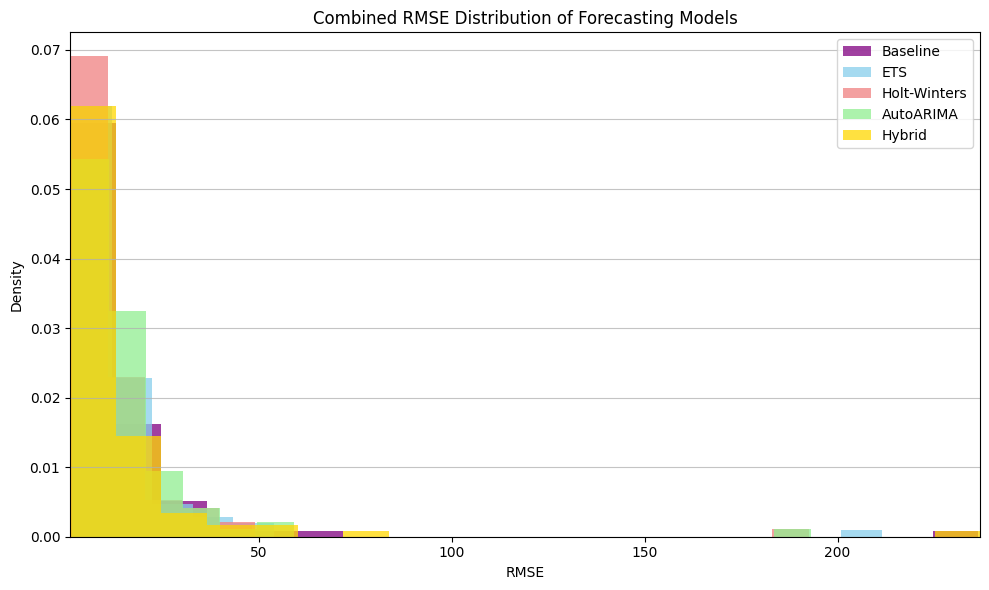

In [ ]:
# Combine all RMSE data for finding global limits
all_rmse = pd.concat([
    ETS_results['RMSE'],
    holt_winters_results['RMSE'],
    auto_arima_results['RMSE'],
    hybrid_df['RMSE'],
    baseline_results_df['RMSE']
])

# Determine global x-limits (for RMSE)
global_rmse_min = all_rmse.min()
global_rmse_max = all_rmse.max()

# Create the figure and a single subplot
plt.figure(figsize=(10, 6))

# Plot overlaid histograms
plt.hist(baseline_results_df['RMSE'], bins=20, density=True, alpha=0.75, label='Baseline', color='purple')
plt.hist(ETS_results['RMSE'], bins=20, density=True, alpha=0.75, label='ETS', color='skyblue')
plt.hist(holt_winters_results['RMSE'], bins=20, density=True, alpha=0.75, label='Holt-Winters', color='lightcoral')
plt.hist(auto_arima_results['RMSE'], bins=20, density=True, alpha=0.75, label='AutoARIMA', color='lightgreen')
plt.hist(hybrid_df['RMSE'], bins=20, density=True, alpha=0.75, label='Hybrid', color='gold')

plt.title('Combined RMSE Distribution of Forecasting Models')
plt.xlabel('RMSE')
plt.ylabel('Density')
plt.xlim([global_rmse_min, global_rmse_max])
plt.legend()
plt.grid(axis='y', alpha=0.75)

plt.tight_layout()
plt.show()

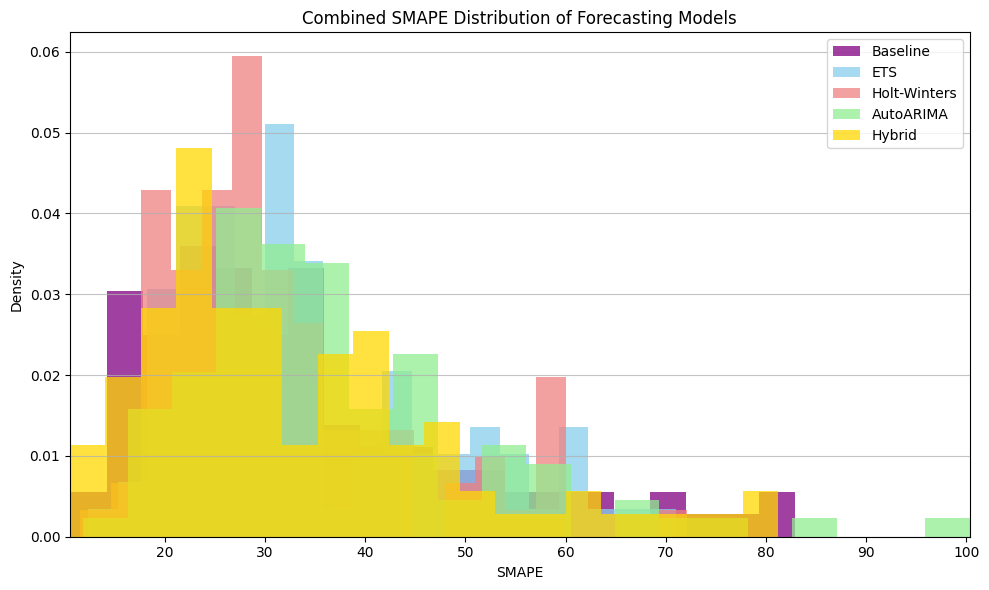

In [ ]:
# Combine all SMAPE data for finding global limits
all_SMAPE = pd.concat([
    ETS_results['SMAPE'],
    holt_winters_results['SMAPE'],
    auto_arima_results['SMAPE'],
    hybrid_df['SMAPE'],
    baseline_results_df['SMAPE']
])

# Determine global x-limits (for SMAPE)
global_SMAPE_min = all_SMAPE.min()
global_SMAPE_max = all_SMAPE.max()

# Create the figure and a single subplot
plt.figure(figsize=(10, 6))

# Plot overlaid histograms
plt.hist(baseline_results_df['SMAPE'], bins=20, density=True, alpha=0.75, label='Baseline', color='purple')
plt.hist(ETS_results['SMAPE'], bins=20, density=True, alpha=0.75, label='ETS', color='skyblue')
plt.hist(holt_winters_results['SMAPE'], bins=20, density=True, alpha=0.75, label='Holt-Winters', color='lightcoral')
plt.hist(auto_arima_results['SMAPE'], bins=20, density=True, alpha=0.75, label='AutoARIMA', color='lightgreen')
plt.hist(hybrid_df['SMAPE'], bins=20, density=True, alpha=0.75, label='Hybrid', color='gold')


plt.title('Combined SMAPE Distribution of Forecasting Models')
plt.xlabel('SMAPE')
plt.ylabel('Density')
plt.xlim([global_SMAPE_min, global_SMAPE_max])
plt.legend()
plt.grid(axis='y', alpha=0.75)

plt.tight_layout()
plt.show()

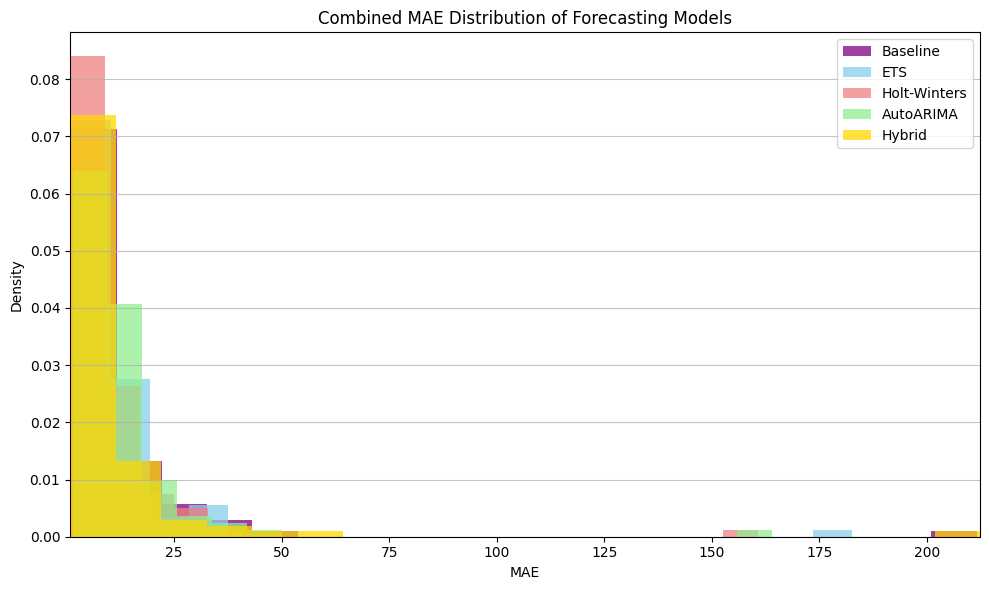

In [ ]:
# Combine all MAE data for finding global limits
all_MAE = pd.concat([
    ETS_results['MAE'],
    holt_winters_results['MAE'],
    auto_arima_results['MAE'],
    hybrid_df['MAE'],
    baseline_results_df['MAE']
])

# Determine global x-limits (for MAE)
global_MAE_min = all_MAE.min()
global_MAE_max = all_MAE.max()

# Create the figure and a single subplot
plt.figure(figsize=(10, 6))

# Plot overlaid histograms
plt.hist(baseline_results_df['MAE'], bins=20, density=True, alpha=0.75, label='Baseline', color='purple')
plt.hist(ETS_results['MAE'], bins=20, density=True, alpha=0.75, label='ETS', color='skyblue')
plt.hist(holt_winters_results['MAE'], bins=20, density=True, alpha=0.75, label='Holt-Winters', color='lightcoral')
plt.hist(auto_arima_results['MAE'], bins=20, density=True, alpha=0.75, label='AutoARIMA', color='lightgreen')
plt.hist(hybrid_df['MAE'], bins=20, density=True, alpha=0.75, label='Hybrid', color='gold')


plt.title('Combined MAE Distribution of Forecasting Models')
plt.xlabel('MAE')
plt.ylabel('Density')
plt.xlim([global_MAE_min, global_MAE_max])
plt.legend()
plt.grid(axis='y', alpha=0.75)

plt.tight_layout()
plt.show()

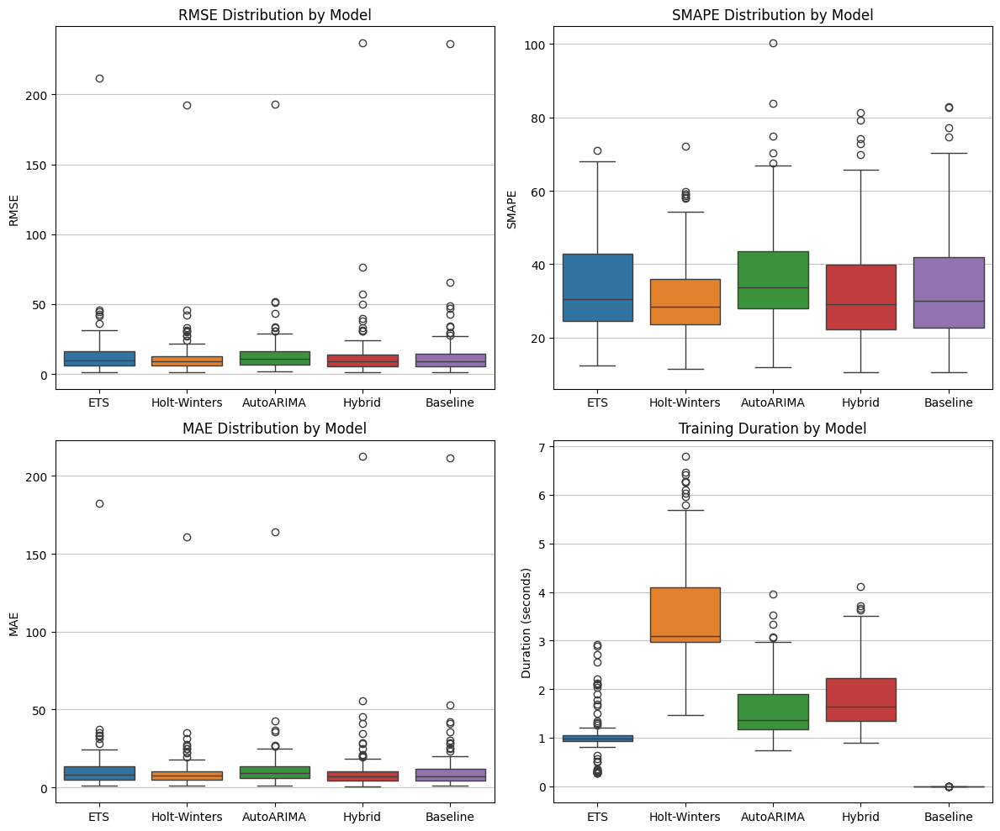

In [ ]:
# Create DataFrames for plotting box plots for all metrics
rmse_data = pd.DataFrame({
    'ETS': ETS_results['RMSE'],
    'Holt-Winters': holt_winters_results['RMSE'],
    'AutoARIMA': auto_arima_results['RMSE'],
    'Hybrid': hybrid_df['RMSE'],
    'Baseline': baseline_results_df['RMSE']
})

smape_data = pd.DataFrame({
    'ETS': ETS_results['SMAPE'],
    'Holt-Winters': holt_winters_results['SMAPE'],
    'AutoARIMA': auto_arima_results['SMAPE'],
    'Hybrid': hybrid_df['SMAPE'],
    'Baseline': baseline_results_df['SMAPE']
})

mae_data = pd.DataFrame({
    'ETS': ETS_results['MAE'],
    'Holt-Winters': holt_winters_results['MAE'],
    'AutoARIMA': auto_arima_results['MAE'],
    'Hybrid': hybrid_df['MAE'],
    'Baseline': baseline_results_df['MAE']
})

duration_data = pd.DataFrame({
    'ETS': ETS_results['Duration'],
    'Holt-Winters': holt_winters_results['Duration'],
    'AutoARIMA': auto_arima_results['Duration'],
    'Hybrid': hybrid_df['Duration'],
    'Baseline': baseline_results_df['Duration']
})


# Create subplots for box plots for all four metrics
fig, axes = plt.subplots(2, 2, figsize=(12, 10)) # Adjusted layout for 4 plots

# Box plot for RMSE
sns.boxplot(data=rmse_data, ax=axes[0, 0])
axes[0, 0].set_title('RMSE Distribution by Model')
axes[0, 0].set_ylabel('RMSE')
axes[0, 0].grid(axis='y', alpha=0.75)

# Box plot for SMAPE
sns.boxplot(data=smape_data, ax=axes[0, 1])
axes[0, 1].set_title('SMAPE Distribution by Model')
axes[0, 1].set_ylabel('SMAPE')
axes[0, 1].grid(axis='y', alpha=0.75)

# Box plot for MAE
sns.boxplot(data=mae_data, ax=axes[1, 0])
axes[1, 0].set_title('MAE Distribution by Model')
axes[1, 0].set_ylabel('MAE')
axes[1, 0].grid(axis='y', alpha=0.75)

# Box plot for Duration
sns.boxplot(data=duration_data, ax=axes[1, 1])
axes[1, 1].set_title('Training Duration by Model')
axes[1, 1].set_ylabel('Duration (seconds)')
axes[1, 1].grid(axis='y', alpha=0.75)


plt.tight_layout()
plt.show()

In [ ]:
# Combine forecast results

def combine_forecast_results(original_df, ets_results, auto_arima_results, holt_winters_results, hybrid_results, baseline_results):

    #combined_data_by_item = {} # This dictionary is not needed
    all_combined_dfs = [] # List to store combined DataFrames for each item

    # Get a list of all unique items from the original data
    unique_items = original_df['Item'].unique()

    for item in unique_items:
        # Filter original data for the current item
        original_item_df = original_df[original_df['Item'] == item][['Item', 'PDay', 'QtyOrd']].copy()
        original_item_df['Series_Type'] = 'Original'
        original_item_df = original_item_df.rename(columns={'QtyOrd': 'Value'})

        # Prepare forecast data for the current item from each model
        forecast_dfs = []

        # ETS Results
        ets_item_results = ets_results[ets_results['Item'] == item]
        if not ets_item_results.empty:
            ets_forecast_values = ets_item_results[[f'Forecast_Period_{i+1}' for i in range(6)]].iloc[0].values
            last_original_date = original_item_df['PDay'].max()
            ets_forecast_dates = pd.date_range(start=last_original_date + pd.DateOffset(months=1), periods=6, freq='MS')
            ets_forecast_df = pd.DataFrame({'Item': item, 'PDay': ets_forecast_dates, 'Value': ets_forecast_values})
            ets_forecast_df['Series_Type'] = 'ETS'
            forecast_dfs.append(ets_forecast_df)

        # AutoARIMA Results
        arima_item_results = auto_arima_results[auto_arima_results['Item'] == item]
        if not arima_item_results.empty:
            arima_forecast_values = arima_item_results[[f'Forecast_Period_{i+1}' for i in range(6)]].iloc[0].values
            last_original_date = original_item_df['PDay'].max()
            arima_forecast_dates = pd.date_range(start=last_original_date + pd.DateOffset(months=1), periods=6, freq='MS')
            arima_forecast_df = pd.DataFrame({'Item': item, 'PDay': arima_forecast_dates, 'Value': arima_forecast_values})
            arima_forecast_df['Series_Type'] = 'AutoARIMA'
            forecast_dfs.append(arima_forecast_df)


        # Holt-Winters Results
        hw_item_results = holt_winters_results[holt_winters_results['Item'] == item]
        if not hw_item_results.empty:
            hw_forecast_values = hw_item_results[[f'Forecast_Period_{i+1}' for i in range(6)]].iloc[0].values
            last_original_date = original_item_df['PDay'].max()
            hw_forecast_dates = pd.date_range(start=last_original_date + pd.DateOffset(months=1), periods=6, freq='MS')
            hw_forecast_df = pd.DataFrame({'Item': item, 'PDay': hw_forecast_dates, 'Value': hw_forecast_values})
            hw_forecast_df['Series_Type'] = 'Holt-Winters'
            forecast_dfs.append(hw_forecast_df)

        # Hybrid Results
        hybrid_item_results = hybrid_results[hybrid_results['Item'] == item]
        if not hybrid_item_results.empty:
            hybrid_forecast_values = hybrid_item_results[[f'Forecast_Period_{i+1}' for i in range(6)]].iloc[0].values
            last_original_date = original_item_df['PDay'].max()
            hybrid_forecast_dates = pd.date_range(start=last_original_date + pd.DateOffset(months=1), periods=6, freq='MS')
            hybrid_forecast_df = pd.DataFrame({'Item': item, 'PDay': hybrid_forecast_dates, 'Value': hybrid_forecast_values})
            hybrid_forecast_df['Series_Type'] = 'Hybrid'
            forecast_dfs.append(hybrid_forecast_df)

        # Baseline Results
        baseline_item_results = baseline_results[baseline_results['Item'] == item]
        if not baseline_item_results.empty:
            baseline_forecast_values = baseline_item_results[[f'Forecast_Period_{i+1}' for i in range(6)]].iloc[0].values
            last_original_date = original_item_df['PDay'].max()
            baseline_forecast_dates = pd.date_range(start=last_original_date + pd.DateOffset(months=1), periods=6, freq='MS')
            baseline_forecast_df = pd.DataFrame({'Item': item, 'PDay': baseline_forecast_dates, 'Value': baseline_forecast_values})
            baseline_forecast_df['Series_Type'] = 'Baseline'
            forecast_dfs.append(baseline_forecast_df)


        # Combine original data and all forecast data for the current item
        if forecast_dfs:
            combined_item_df = pd.concat([original_item_df] + forecast_dfs, ignore_index=True)
        else:
            combined_item_df = original_item_df # Only original data if no forecasts available

        # Sort by PDay
        combined_item_df = combined_item_df.sort_values(by='PDay').reset_index(drop=True)

        # Append the combined DataFrame for the current item to the list
        all_combined_dfs.append(combined_item_df)

    # Concatenate all combined DataFrames into a single DataFrame before returning
    if all_combined_dfs:
        final_combined_df = pd.concat(all_combined_dfs, ignore_index=True)
    else:
        final_combined_df = pd.DataFrame() # Return empty DataFrame if no items were processed

    return final_combined_df

In [ ]:
# Combine forecast results with origianl cleaned data for visualization
combined_forecasts_df = combine_forecast_results(selected_items_df, ETS_results, auto_arima_results, holt_winters_results, hybrid_df, baseline_results_df)

In [ ]:
combined_forecasts_df

,Item,PDay,Value,Series_Type
0,Prod1012,2022-01-01,1,Original
1,Prod1012,2022-02-01,0,Original
2,Prod1012,2022-03-01,0,Original
3,Prod1012,2022-04-01,0,Original
4,Prod1012,2022-05-01,0,Original
...,...,...,...,...
7155,Prod997,2025-12-01,27,AutoARIMA
7156,Prod997,2025-12-01,31,Holt-Winters
7157,Prod997,2025-12-01,31,ETS
7158,Prod997,2025-12-01,26,Hybrid


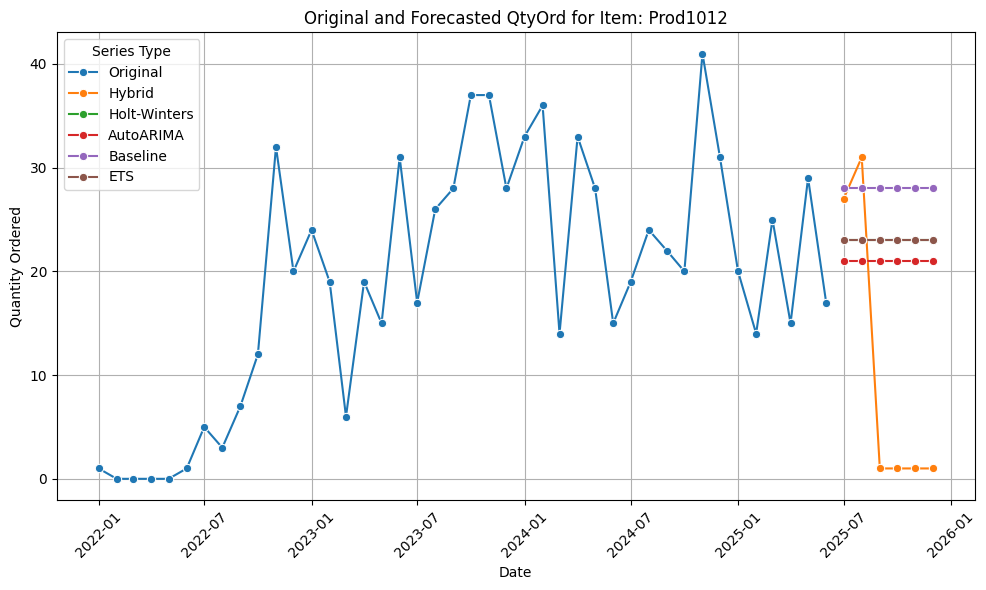

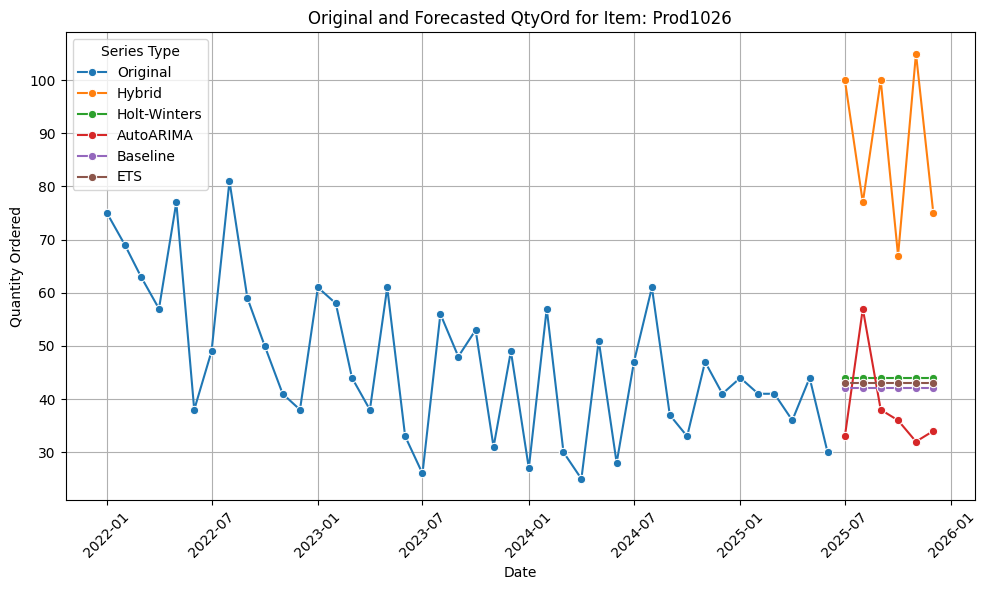

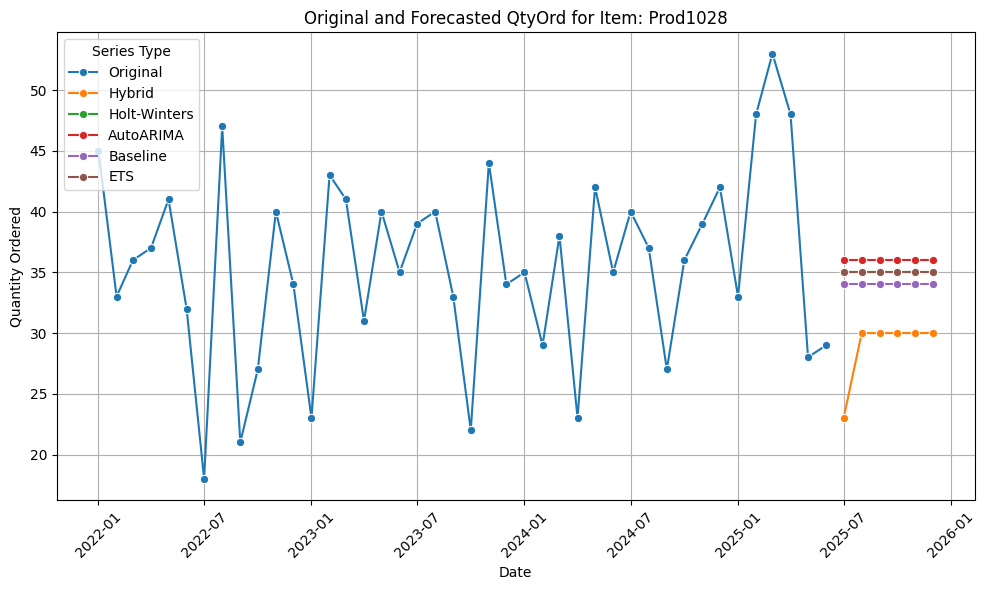

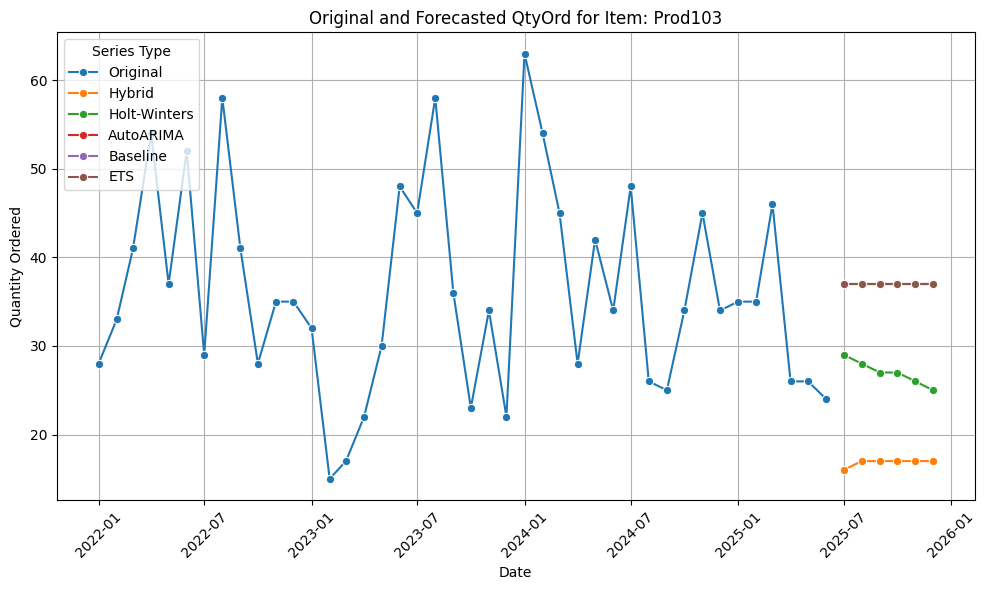

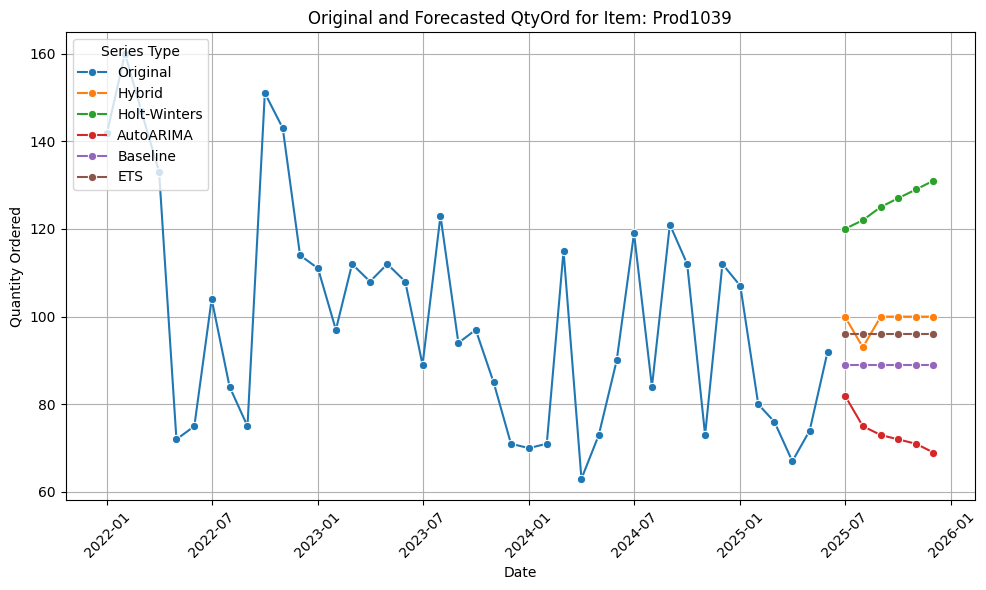

...

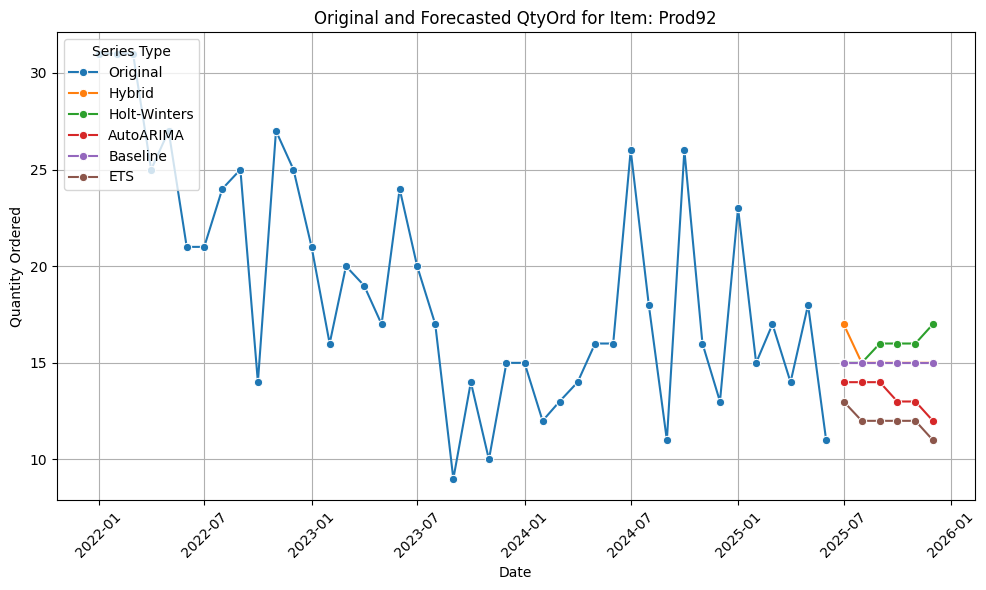

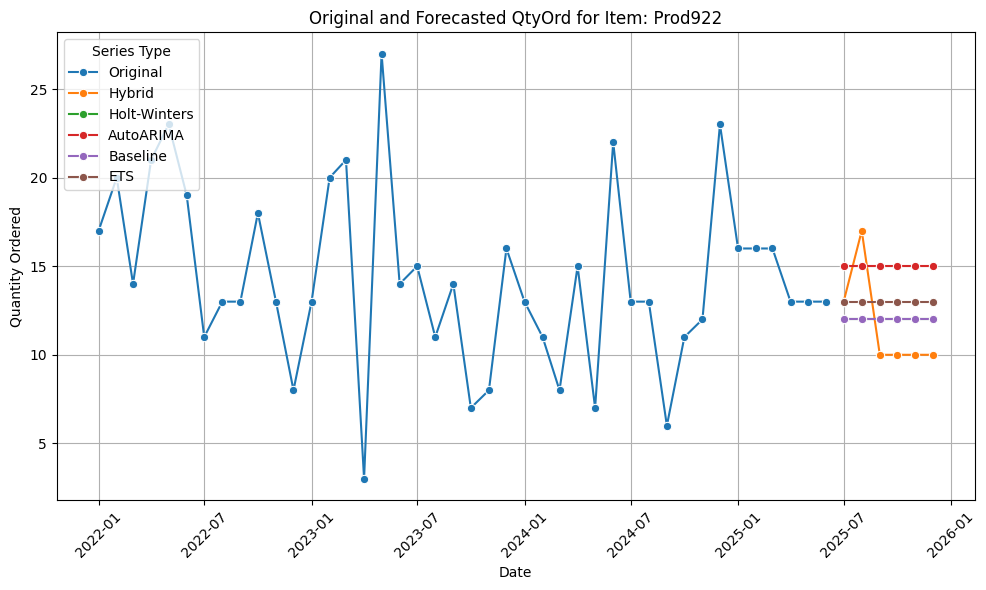

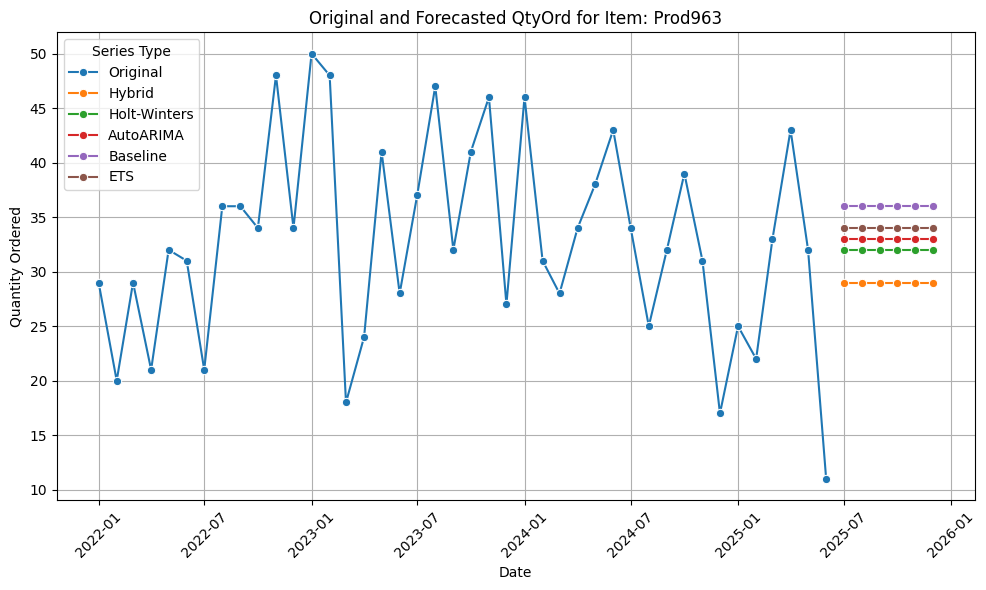

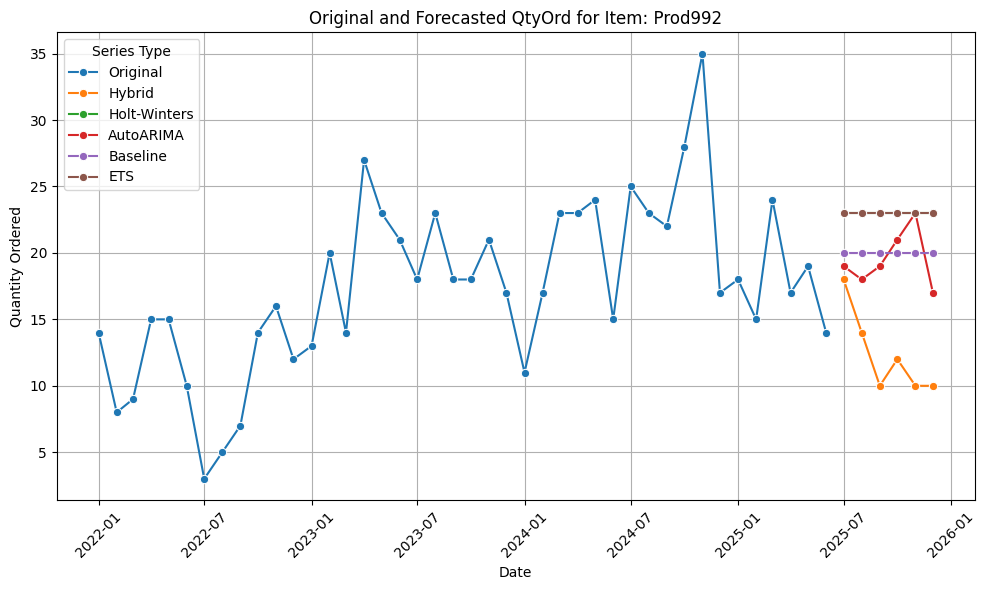

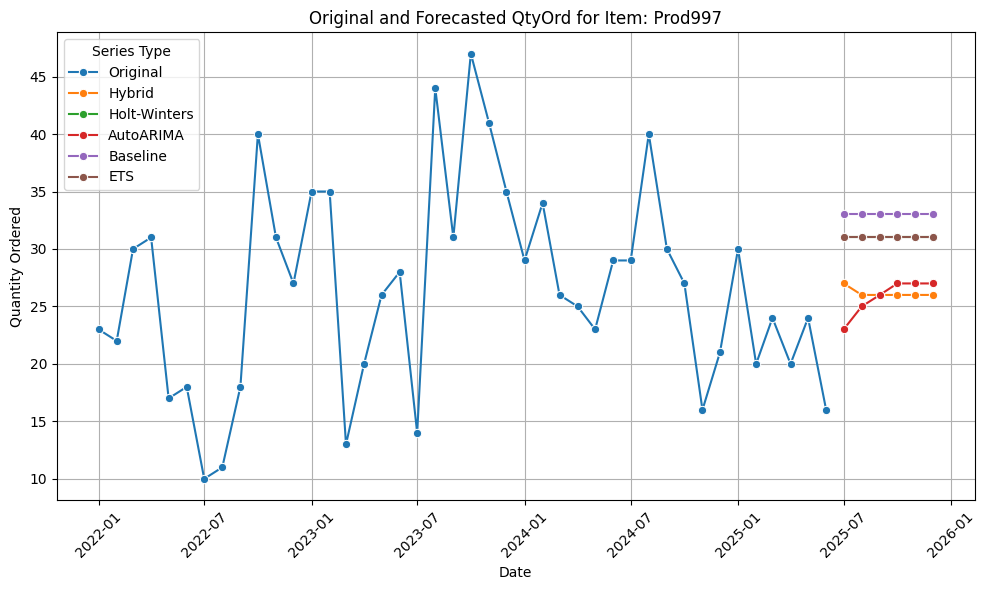

In [ ]:
#combined_forecast = pd.concat(combined_forecasts.values(), ignore_index=True)

# Get the unique items from the keys of the combined_forecasts dictionary
unique_items_to_plot = combined_forecasts_df['Item'].unique()

for item in unique_items_to_plot:
  plt.figure(figsize=(10, 6))
  # Access the DataFrame for the current item from the dictionary
  item_data = combined_forecasts_df[combined_forecasts_df['Item'] == item].copy()
  sns.lineplot(data = item_data, x = 'PDay', y = 'Value', hue = 'Series_Type', marker='o')

  plt.title(f'Original and Forecasted QtyOrd for Item: {item}')
  plt.xlabel('Date')
  plt.ylabel('Quantity Ordered')
  plt.legend(title='Series Type', loc='upper left')
  plt.grid(True)
  plt.xticks(rotation=45)
  plt.tight_layout()
  plt.show()

In [ ]:
# Combine each algorithms metrics into a dataframe for visualization and analyses use

def combine_metric_results(ets_results, auto_arima_results, holt_winters_results, hybrid_results, baseline_results):

    combined_metrics_list = []

    # Process ETS results
    if not ets_results.empty:
        ets_metrics = ets_results[['Item', 'Duration', 'RMSE', 'SMAPE', 'MAE']].copy()
        ets_metrics['Series_Type'] = 'ETS'
        combined_metrics_list.append(ets_metrics)

    # Process AutoARIMA results
    if not auto_arima_results.empty:
        arima_metrics = auto_arima_results[['Item', 'Duration', 'RMSE', 'SMAPE', 'MAE']].copy()
        arima_metrics['Series_Type'] = 'AutoARIMA'
        combined_metrics_list.append(arima_metrics)

    # Process Holt-Winters results
    if not holt_winters_results.empty:
        hw_metrics = holt_winters_results[['Item', 'Duration', 'RMSE', 'SMAPE', 'MAE']].copy()
        hw_metrics['Series_Type'] = 'Holt-Winters'
        combined_metrics_list.append(hw_metrics)

    # Process Hybrid results
    if not hybrid_results.empty:
        hybrid_metrics = hybrid_results[['Item', 'Duration', 'RMSE', 'SMAPE', 'MAE']].copy()
        hybrid_metrics['Series_Type'] = 'Hybrid'
        combined_metrics_list.append(hybrid_metrics)

     # Process Baseline results - Baseline does not have a meaningful duration in seconds like the others
    if not baseline_results.empty:
        baseline_metrics = baseline_results[['Item', 'Duration', 'RMSE', 'SMAPE', 'MAE']].copy()
        # Assign a placeholder like 0 or NaN, or handle separately. Let's assign 0 for now,
        # but it's important to note this isn't a true training duration.
        baseline_metrics['Duration'] = 0 # Or np.nan if you want to exclude from median
        baseline_metrics['Series_Type'] = 'Baseline'
        combined_metrics_list.append(baseline_metrics)


    # Concatenate all metric DataFrames
    if combined_metrics_list:
        combined_metrics_df = pd.concat(combined_metrics_list, ignore_index=True)
        # Convert Duration to numeric, coercing errors will turn 'Baseline' (if not already 0/NaN) into NaN
        combined_metrics_df['Duration'] = pd.to_numeric(combined_metrics_df['Duration'], errors='coerce')

    else:
        combined_metrics_df = pd.DataFrame() # Return empty DataFrame if no results

    return combined_metrics_df

In [ ]:
# Call the function to combine metric results
combined_metrics_df = combine_metric_results(ETS_results, auto_arima_results, holt_winters_results, hybrid_df, baseline_results_df)

# Display the combined metrics DataFrame
print("\nCombined Forecasting Model Metrics:")
display(combined_metrics_df)


Combined Forecasting Model Metrics:


,Item,Duration,RMSE,SMAPE,MAE,Series_Type
0,Prod1012,0.815143,8.843713,29.934454,6.966487,ETS
1,Prod1026,2.082709,11.264793,22.163346,9.290087,ETS
2,Prod1028,1.264442,7.503647,17.651728,6.233144,ETS
3,Prod103,0.968513,12.193174,30.252122,10.556250,ETS
4,Prod1039,1.041715,18.584861,18.278079,16.938145,ETS
...,...,...,...,...,...,...
495,Prod92,0.000000,4.944132,20.538748,3.555556,Baseline
496,Prod922,0.000000,4.659469,22.819166,3.324074,Baseline
497,Prod963,0.000000,12.162004,35.129542,9.787037,Baseline
498,Prod992,0.000000,6.584740,24.082435,5.194444,Baseline


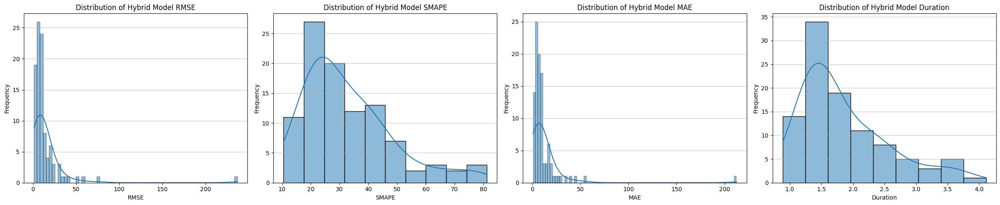

In [ ]:
metrics = ['RMSE', 'SMAPE', 'MAE', 'Duration']

# Create a figure and a set of subplots
fig, axes = plt.subplots(1, len(metrics), figsize=(6 * len(metrics), 5)) # Adjusted figsize for horizontal layout

for i, metric in enumerate(metrics):
    sns.histplot(hybrid_df[metric], kde=True, ax=axes[i])
    axes[i].set_title(f'Distribution of Hybrid Model {metric}')
    axes[i].set_xlabel(metric)
    axes[i].set_ylabel('Frequency')
    axes[i].grid(axis='y', alpha=0.75)

plt.tight_layout()
plt.show()

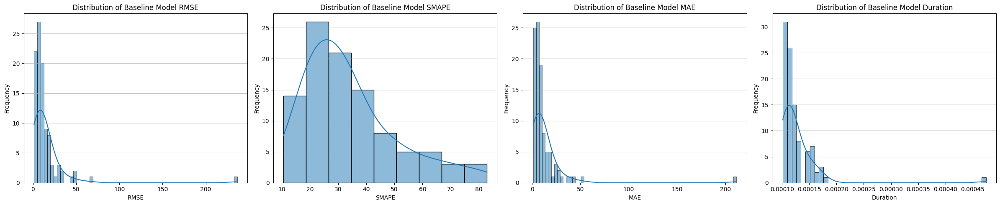

In [ ]:
metrics = ['RMSE', 'SMAPE', 'MAE', 'Duration']

# Create a figure and a set of subplots
fig, axes = plt.subplots(1, len(metrics), figsize=(6 * len(metrics), 5)) # Adjusted figsize for horizontal layout

for i, metric in enumerate(metrics):
    sns.histplot(baseline_results_df[metric], kde=True, ax=axes[i])
    axes[i].set_title(f'Distribution of Baseline Model {metric}')
    axes[i].set_xlabel(metric)
    axes[i].set_ylabel('Frequency')
    axes[i].grid(axis='y', alpha=0.75)

plt.tight_layout()
plt.show()

Evaluate model metrics per median value

In [ ]:
# Re-run the function to combine metric results to ensure Duration is numeric
combined_metrics_df = combine_metric_results(ETS_results, auto_arima_results, holt_winters_results, hybrid_df, baseline_results_df)

# Calculate the median of metrics per Series_Type
median_metrics_by_series = combined_metrics_df.groupby('Series_Type')[['RMSE', 'SMAPE', 'MAE', 'Duration']].median()

# Display the results
print("\nMedian Metrics by Forecasting Model Type:")
display(median_metrics_by_series)


Median Metrics by Forecasting Model Type:


,RMSE,SMAPE,MAE,Duration
Series_Type,,,,
AutoARIMA,11.073133,33.721273,9.072050,1.367055
Baseline,9.008736,29.980337,7.267361,0.000000
ETS,9.558385,30.457166,7.981615,0.989136
Holt-Winters,9.016344,28.323887,7.576741,3.084722
Hybrid,8.788110,29.139727,7.171412,1.637940


In [ ]:
# Identify the best model (Series_Type) for each item based on the lowest RMSE, SMAPE, and MAE

best_model_by_rmse = combined_metrics_df.loc[combined_metrics_df.groupby('Item')['RMSE'].idxmin()][['Item', 'Series_Type', 'RMSE']]
best_model_by_smape = combined_metrics_df.loc[combined_metrics_df.groupby('Item')['SMAPE'].idxmin()][['Item', 'Series_Type', 'SMAPE']]
best_model_by_mae = combined_metrics_df.loc[combined_metrics_df.groupby('Item')['MAE'].idxmin()][['Item', 'Series_Type', 'MAE']]

print("\nBest Model by Lowest RMSE per Item:")
display(best_model_by_rmse.reset_index(drop=True))

print("\nBest Model by Lowest SMAPE per Item:")
display(best_model_by_smape.reset_index(drop=True))

print("\nBest Model by Lowest MAE per Item:")
display(best_model_by_mae.reset_index(drop=True))


Best Model by Lowest RMSE per Item:


,Item,Series_Type,RMSE
0,Prod1012,Holt-Winters,8.633895
1,Prod1026,Baseline,5.507571
2,Prod1028,AutoARIMA,7.482944
3,Prod103,Baseline,8.041559
4,Prod1039,Holt-Winters,16.898426
...,...,...,...
95,Prod92,ETS,4.650580
96,Prod922,Baseline,4.659469
97,Prod963,Holt-Winters,9.346109
98,Prod992,Holt-Winters,6.308058



Best Model by Lowest SMAPE per Item:


,Item,Series_Type,SMAPE
0,Prod1012,Hybrid,28.989601
1,Prod1026,Baseline,10.638852
2,Prod1028,AutoARIMA,17.509005
3,Prod103,Baseline,20.186187
4,Prod1039,Hybrid,14.256972
...,...,...,...
95,Prod92,Baseline,20.538748
96,Prod922,Baseline,22.819166
97,Prod963,AutoARIMA,24.460357
98,Prod992,Hybrid,23.930574



Best Model by Lowest MAE per Item:


,Item,Series_Type,MAE
0,Prod1012,Holt-Winters,6.861614
1,Prod1026,Baseline,4.111111
2,Prod1028,AutoARIMA,6.184976
3,Prod103,Baseline,6.888889
4,Prod1039,Hybrid,13.341414
...,...,...,...
95,Prod92,ETS,3.377354
96,Prod922,Baseline,3.324074
97,Prod963,Hybrid,7.725061
98,Prod992,Hybrid,4.881999


In [ ]:
# Count the number of items where each Series_Type had the lowest RMSE
rmse_best_model_counts = best_model_by_rmse['Series_Type'].value_counts().reset_index()
rmse_best_model_counts.columns = ['Series_Type', 'Count_Lowest_RMSE']
print("\nNumber of Items with Lowest RMSE by Model Type:")
display(rmse_best_model_counts)

# Count the number of items where each Series_Type had the lowest SMAPE
smape_best_model_counts = best_model_by_smape['Series_Type'].value_counts().reset_index()
smape_best_model_counts.columns = ['Series_Type', 'Count_Lowest_SMAPE']
print("\nNumber of Items with Lowest SMAPE by Model Type:")
display(smape_best_model_counts)


# Count the number of items where each Series_Type had the lowest MAE
mae_best_model_counts = best_model_by_mae['Series_Type'].value_counts().reset_index()
mae_best_model_counts.columns = ['Series_Type', 'Count_Lowest_MAE']
print("\nNumber of Items with Lowest MAE by Model Type:")
display(mae_best_model_counts)


Number of Items with Lowest RMSE by Model Type:


,Series_Type,Count_Lowest_RMSE
0,Hybrid,43
1,Holt-Winters,26
2,Baseline,25
3,ETS,4
4,AutoARIMA,2



Number of Items with Lowest SMAPE by Model Type:


,Series_Type,Count_Lowest_SMAPE
0,Hybrid,36
1,Baseline,30
2,Holt-Winters,23
3,ETS,8
4,AutoARIMA,3



Number of Items with Lowest MAE by Model Type:


,Series_Type,Count_Lowest_MAE
0,Hybrid,43
1,Baseline,26
2,Holt-Winters,24
3,ETS,6
4,AutoARIMA,1


In [ ]:
# Combine the best model counts into a single DataFrame
combined_best_model_counts = pd.merge(rmse_best_model_counts, smape_best_model_counts, on='Series_Type', how='outer')
combined_best_model_counts = pd.merge(combined_best_model_counts, mae_best_model_counts, on='Series_Type', how='outer')

# Fill any potential NaN values with 0 (in case a model didn't have the lowest for a metric)
combined_best_model_counts = combined_best_model_counts.fillna(0).astype({'Count_Lowest_RMSE': int, 'Count_Lowest_SMAPE': int, 'Count_Lowest_MAE': int})

# Rank the models based on each metric count (lower count is better, so rank ascending)
combined_best_model_counts['Rank_RMSE'] = combined_best_model_counts['Count_Lowest_RMSE'].rank(ascending=False, method='min').astype(int)
combined_best_model_counts['Rank_SMAPE'] = combined_best_model_counts['Count_Lowest_SMAPE'].rank(ascending=False, method='min').astype(int)
combined_best_model_counts['Rank_MAE'] = combined_best_model_counts['Count_Lowest_MAE'].rank(ascending=False, method='min').astype(int)

# Display the combined DataFrame, ordered by the sum of ranks or by RMSE rank as primary
combined_best_model_counts['Total_Rank'] = combined_best_model_counts['Rank_RMSE'] + combined_best_model_counts['Rank_SMAPE'] + combined_best_model_counts['Rank_MAE']
combined_best_model_counts_ranked = combined_best_model_counts.sort_values(by='Total_Rank').reset_index(drop=True)


print("\nCombined Best Model Counts and Ranks by Metric:")
display(combined_best_model_counts_ranked[['Series_Type', 'Count_Lowest_RMSE', 'Rank_RMSE', 'Count_Lowest_SMAPE', 'Rank_SMAPE', 'Count_Lowest_MAE', 'Rank_MAE']])


Combined Best Model Counts and Ranks by Metric:


,Series_Type,Count_Lowest_RMSE,Rank_RMSE,Count_Lowest_SMAPE,Rank_SMAPE,Count_Lowest_MAE,Rank_MAE
0,Hybrid,43,1,36,1,43,1
1,Baseline,25,3,30,2,26,2
2,Holt-Winters,26,2,23,3,24,3
3,ETS,4,4,8,4,6,4
4,AutoARIMA,2,5,3,5,1,5


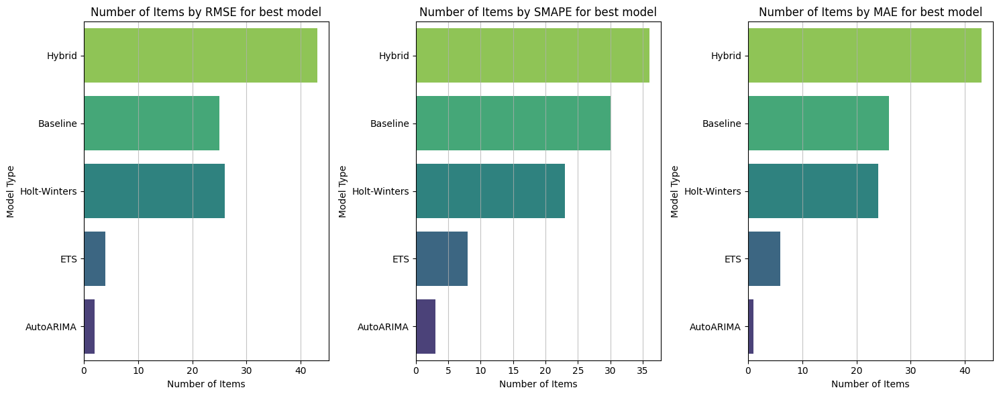

In [ ]:
# Create bar charts for the number of items with the lowest RMSE, SMAPE, and MAE

metrics = ['RMSE', 'SMAPE', 'MAE']
counts_cols = [f'Count_Lowest_{metric}' for metric in metrics]

fig, axes = plt.subplots(1, len(metrics), figsize=(15, 6))

for i, metric in enumerate(metrics):
    sns.barplot(data=combined_best_model_counts_ranked, y='Series_Type', x=f'Count_Lowest_{metric}', ax=axes[i], palette='viridis_r') # Changed palette to viridis_r for reversed colors
    axes[i].set_title(f'Number of Items by {metric} for best model')
    axes[i].set_xlabel('Number of Items')
    axes[i].set_ylabel('Model Type')
    axes[i].grid(axis='x', alpha=0.75)

plt.tight_layout()
plt.show()

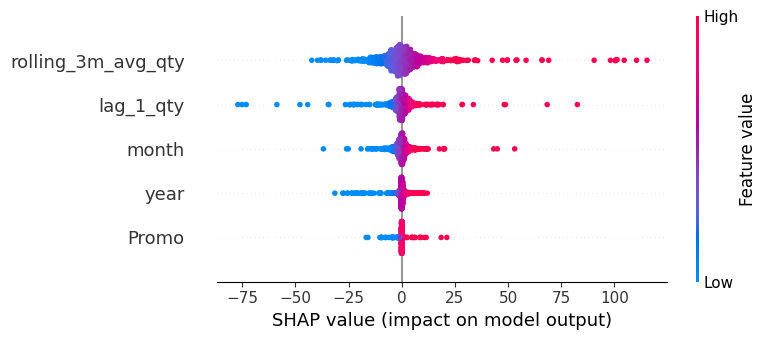

In [ ]:
import shap
import matplotlib.pyplot as plt

# Separate the SHAP values and the feature values
# The first columns of shap_values_df are the SHAP values for the features
# The last two columns are 'Item' and 'PDay', which are not features for the plot
feature_names = ['month', 'year', 'lag_1_qty', 'rolling_3m_avg_qty', 'Promo']
shap_values = shap_values_df[feature_names].values
X_values = shap_values_df[feature_names] # Use the original feature values for the plot

# This plot shows the distribution of the impact of each feature on the model output
shap.summary_plot(shap_values, X_values, feature_names=feature_names)



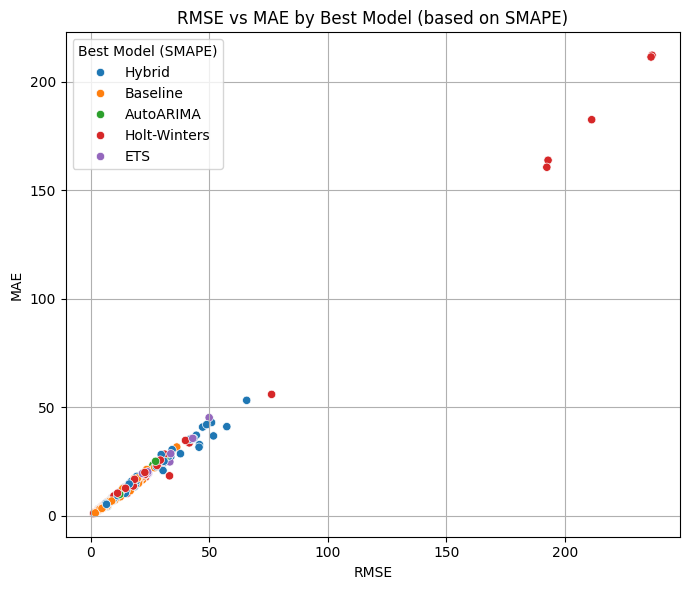

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Merge the combined metrics with the best model based on SMAPE to get the Series_Type for each item
merged_metrics = pd.merge(combined_metrics_df, best_model_by_smape[['Item', 'Series_Type']], on='Item', how='left', suffixes=('', '_best_smape'))

# Create the scatter plot
plt.figure(figsize=(7, 6))
sns.scatterplot(data=merged_metrics, x='RMSE', y='MAE', hue='Series_Type_best_smape')

plt.title('RMSE vs MAE by Best Model (based on SMAPE)')
plt.xlabel('RMSE')
plt.ylabel('MAE')
plt.legend(title='Best Model (SMAPE)', loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
Garch_company

,Item,ProdCat,CompanyRank,PDay,QtyOrd,Promo,Company_Outlier_flag
671,Prod1012,Living,A,2022-01-01,1,0,False
672,Prod1012,Living,A,2022-02-01,0,0,False
673,Prod1012,Living,A,2022-03-01,0,0,False
674,Prod1012,Living,A,2022-04-01,0,0,False
675,Prod1012,Living,A,2022-05-01,0,0,False
...,...,...,...,...,...,...,...
63470,Prod997,Living,A,2025-02-01,20,0,False
63471,Prod997,Living,A,2025-03-01,24,0,False
63472,Prod997,Living,A,2025-04-01,20,0,False
63473,Prod997,Living,A,2025-05-01,24,0,False


# Testing of the ARIMA-GARCH process

In [ ]:
!pip install arch -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 978.3/978.3 kB 14.6 MB/s eta 0:00:00


In [ ]:
import arch
from sklearn.model_selection import TimeSeriesSplit
import time
import itertools
import numpy as np
import pandas as pd
from math import sqrt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from statsmodels.tsa.arima.model import ARIMA

# Custom function to calculate sMAPE
def smape(y_true, y_pred):
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    abs_diff = np.abs(y_true - y_pred)
    denominator = (np.abs(y_true) + np.abs(y_pred)) / 2
    ratio = np.zeros_like(y_true, dtype=float)
    non_zero_denom_mask = denominator != 0
    ratio[non_zero_denom_mask] = abs_diff[non_zero_denom_mask] / denominator[non_zero_denom_mask]
    smape_value = np.mean(ratio) * 100
    return smape_value


def perform_arima_garch_modeling(df):
    arima_garch_results = pd.DataFrame(columns=[
        'Item',
        'ARIMA_Order_p', 'ARIMA_Order_d', 'ARIMA_Order_q',
        'ARIMA_Seasonal_Order_P', 'ARIMA_Seasonal_Order_D', 'ARIMA_Seasonal_Order_Q', 'ARIMA_Seasonal_Order_m',
        'GARCH_Order_p', 'GARCH_Order_q',
        'Duration',
        'RMSE', 'SMAPE', 'MAE',
        'Forecast_Period_1', 'Forecast_Period_2',
        'Forecast_Period_3', 'Forecast_Period_4', 'Forecast_Period_5',
        'Forecast_Period_6'
    ])

    unique_items = df['Item'].unique()
    seasonal_period = 12 # Assuming monthly data
    forecast_periods = 6
    n_splits = 3 # Number of splits for TimeSeriesSplit

    # Define possible parameters for grid search for GARCH (p, q)
    garch_p_params = [0, 1, 2]
    garch_q_params = [0, 1, 2]

    for item in unique_items:
        print(f"Processing Item for ARIMA-GARCH: {item}")

        item_data = df[df['Item'] == item].copy()
        item_data = item_data.sort_values(by='PDay')

        # Ensure data is a time series with the correct frequency (Monthly Start 'MS')
        item_ts = item_data.set_index('PDay')['QtyOrd'].asfreq('MS')

         # Check if there are enough data points for time series cross-validation
        if len(item_ts) < n_splits + 1:
            print(f"Skipping Item {item}: Not enough data for {n_splits}-fold cross-validation.")
            item_results = {
                'Item': item, 'ARIMA_Order_p': None, 'ARIMA_Order_d': None, 'ARIMA_Order_q': None,
                'ARIMA_Seasonal_Order_P': None, 'ARIMA_Seasonal_Order_D': None, 'ARIMA_Seasonal_Order_Q': None, 'ARIMA_Seasonal_Order_m': None,
                'GARCH_Order_p': None, 'GARCH_Order_q': None,
                'Duration': None, 'RMSE': float('inf'), 'SMAPE': float('inf'), 'MAE': float('inf')
            }
            for i in range(forecast_periods):
                 item_results[f'Forecast_Period_{i+1}'] = None
            arima_garch_results = pd.concat([arima_garch_results, pd.DataFrame([item_results])], ignore_index=True)
            continue


        train_start_time = time.time()

        #Arima result

        # Using statsmodels ARIMA for auto selection based on AICc
        best_arima_order = (0, 0, 0)
        best_arima_seasonal_order = (0, 0, 0, 0)
        best_arima_aicc = float('inf')
        best_arima_model = None

        # Define a range of ARIMA orders to search (simplified grid for demonstration)
        p_values = range(3)
        d_values = range(2)
        q_values = range(3)
        P_values = range(2)
        D_values = range(2)
        Q_values = range(2)

        arima_param_combinations = list(itertools.product(p_values, d_values, q_values, P_values, D_values, Q_values))

        for order in arima_param_combinations:
            p, d, q, P, D, Q = order
            try:
                # Fit ARIMA model to the entire time series for this item to find the best order
                # We fit on the full data to determine the best overall structure
                model = ARIMA(item_ts, order=(p, d, q), seasonal_order=(P, D, Q, seasonal_period))
                model_fit = model.fit()
                if model_fit.aicc < best_arima_aicc:
                    best_arima_aicc = model_fit.aicc
                    best_arima_order = (p, d, q)
                    best_arima_seasonal_order = (P, D, Q, seasonal_period)
                    best_arima_model = model_fit # Store the fitted model

            except Exception as e:
                # print(f"ARIMA fit error for item {item} with order {(p, d, q)}x{(P, D, Q, seasonal_period)}: {e}")
                continue # Continue to the next parameter combination


        if best_arima_model is None:
             print(f"Skipping Item {item}: Could not find a suitable ARIMA model.")
             train_end_time = time.time()
             duration = train_end_time - train_start_time
             item_results = {
                'Item': item, 'ARIMA_Order_p': None, 'ARIMA_Order_d': None, 'ARIMA_Order_q': None,
                'ARIMA_Seasonal_Order_P': None, 'ARIMA_Seasonal_Order_D': None, 'ARIMA_Seasonal_Order_Q': None, 'ARIMA_Seasonal_Order_m': None,
                'GARCH_Order_p': None, 'GARCH_Order_q': None,
                'Duration': duration, 'RMSE': float('inf'), 'SMAPE': float('inf'), 'MAE': float('inf')
            }
             for i in range(forecast_periods):
                  item_results[f'Forecast_Period_{i+1}'] = None
             arima_garch_results = pd.concat([arima_garch_results, pd.DataFrame([item_results])], ignore_index=True)
             continue


        # Second step: Fit GARCH to the ARIMA residuals
        # We will perform cross-validation for the combined model evaluation

        best_avg_rmse = float('inf')
        best_garch_params = {}
        best_avg_smape = float('inf')
        best_avg_mae = float('inf')
        best_combined_model = None # Store the best combined (ARIMA+GARCH) model components


        garch_param_combinations = list(itertools.product(garch_p_params, garch_q_params))

        for garch_p, garch_q in garch_param_combinations:
            if garch_p == 0 and garch_q == 0:
                continue

            fold_rmses = []
            fold_smapes = []
            fold_maes = []

            tscv = TimeSeriesSplit(n_splits=n_splits)

            try:
                for train_index, test_index in tscv.split(item_ts):
                    train_data, test_data = item_ts.iloc[train_index], item_ts.iloc[test_index]

                    # Fit ARIMA on the training data
                    arima_train_model = ARIMA(train_data,
                                              order=best_arima_order,
                                              seasonal_order=best_arima_seasonal_order if best_arima_seasonal_order[3] > 1 else (0,0,0,0))
                    arima_train_fit = arima_train_model.fit()

                    # Get ARIMA residuals on the training data
                    arima_train_residuals = train_data - arima_train_fit.predict(start=0, end=len(train_data)-1)

                    # Fit GARCH on the ARIMA training residuals
                    garch_train_model = arch.arch_model(arima_train_residuals, mean='Zero', vol='Garch', p=garch_p, q=garch_q, rescale=False)
                    garch_train_fit = garch_train_model.fit(disp='off')

                    # Forecast ARIMA for the test period
                    arima_test_forecast = arima_train_fit.forecast(steps=len(test_data))

                    # Forecast GARCH residuals for the test period

                    garch_test_residuals_forecast = pd.Series(0.0, index=test_data.index)

                    # Combine forecasts: ARIMA forecast + GARCH residual forecast (which is 0 in this case)

                    combined_predictions = arima_test_forecast + garch_test_residuals_forecast

                     # Ensure predictions are non-negative
                    combined_predictions[combined_predictions < 0] = 0


                    fold_rmses.append(sqrt(mean_squared_error(test_data, combined_predictions)))
                    fold_smapes.append(smape(test_data, combined_predictions))
                    fold_maes.append(mean_absolute_error(test_data, combined_predictions))


                # Calculate average metrics across folds
                avg_rmse = np.mean(fold_rmses)
                avg_smape = np.mean(fold_smapes)
                avg_mae = np.mean(fold_maes)


                if avg_rmse < best_avg_rmse:
                    best_avg_rmse = avg_rmse
                    best_avg_smape = avg_smape
                    best_avg_mae = avg_mae
                    best_garch_params = {'p': garch_p, 'q': garch_q}


            except Exception as e:
                # print(f"ARIMA-GARCH cross-validation error for item {item} with GARCH params p={garch_p}, q={garch_q}: {e}")
                continue # Continue to the next GARCH parameter combination


        train_end_time = time.time()
        duration = train_end_time - train_start_time

        # Prepare future forecast using the best found ARIMA and GARCH parameters
        future_forecast_rounded = [None] * forecast_periods # Initialize with None

        if best_garch_params:
            try:
                # Refit ARIMA on the entire dataset
                final_arima_model = ARIMA(item_ts,
                                          order=best_arima_order,
                                          seasonal_order=best_arima_seasonal_order if best_arima_seasonal_order[3] > 1 else (0,0,0,0))
                final_arima_fit = final_arima_model.fit()

                # Get residuals from the final ARIMA model
                final_arima_residuals = item_ts - final_arima_fit.predict(start=0, end=len(item_ts)-1)

                # Fit GARCH on the final ARIMA residuals with the best GARCH parameters
                final_garch_model = arch.arch_model(final_arima_residuals, mean='Zero', vol='Garch', p=best_garch_params['p'], q=best_garch_params['q'], rescale=False)
                final_garch_fit = final_garch_model.fit(disp='off')

                # Forecast ARIMA for future periods
                arima_future_forecast = final_arima_fit.forecast(steps=forecast_periods)

                # Forecast GARCH residuals for future periods (mean forecast is 0)
                garch_future_residuals_forecast = pd.Series(0.0, index=arima_future_forecast.index) # Assuming mean of residuals is 0

                # Combine future forecasts
                combined_future_forecast = arima_future_forecast + garch_future_residuals_forecast

                 # Ensure future forecasts are non-negative and round up
                combined_future_forecast[combined_future_forecast < 0] = 0
                future_forecast_rounded = np.ceil(combined_future_forecast).astype(int).tolist()


            except Exception as e:
                print(f"Error during final ARIMA-GARCH forecasting for item {item}: {e}")
                # Keep future_forecast_rounded as None or handle appropriately

        item_results = {
            'Item': item,
            'ARIMA_Order_p': best_arima_order[0], 'ARIMA_Order_d': best_arima_order[1], 'ARIMA_Order_q': best_arima_order[2],
            'ARIMA_Seasonal_Order_P': best_arima_seasonal_order[0], 'ARIMA_Seasonal_Order_D': best_arima_seasonal_order[1], 'ARIMA_Seasonal_Order_Q': best_arima_seasonal_order[2], 'ARIMA_Seasonal_Order_m': best_arima_seasonal_order[3],
            'GARCH_Order_p': best_garch_params.get('p'),
            'GARCH_Order_q': best_garch_params.get('q'),
            'Duration': duration,
            'RMSE': best_avg_rmse,
            'SMAPE': best_avg_smape,
            'MAE': best_avg_mae,
        }
        # Add future forecast values
        for i in range(forecast_periods):
            item_results[f'Forecast_Period_{i+1}'] = future_forecast_rounded[i] if i < len(future_forecast_rounded) else None

        arima_garch_results = pd.concat([arima_garch_results, pd.DataFrame([item_results])], ignore_index=True)

    return arima_garch_results

In [ ]:
# The ARIMA-GARCh process was not included due to the lengthy processing time and result during test.
# The code are commit out to avoid problem.

#arima_garch_results = perform_arima_garch_modeling(Garch_company)
#print("\nARIMA-GARCH Modeling Results:")
#display(arima_garch_results)

In [ ]:
# Calculation of Hybrid Residuals

# To review residual distributation pattern

def calculate_hybrid_residuals(original_df, test_predictions_df):

    all_hybrid_residuals_list = []

    # Get the list of unique items from the test_predictions_df
    unique_items_with_predictions = test_predictions_df['Item'].unique()

    # Iterate through each unique item
    for item in unique_items_with_predictions:
        # Filter actual values from original_df for the current item
        original_item_df = original_df[original_df['Item'] == item].copy()
        original_item_df = original_item_df.sort_values(by='PDay').reset_index(drop=True)

        # Determine the split point (80% train, 20% test)
        train_size = int(len(original_item_df) * 0.8)

        # Get the actual values from the test set of the original data
        actual_test_values = original_item_df[['PDay', 'QtyOrd']].iloc[train_size:]

        # Filter the hybrid model's predictions for the test set for the current item
        hybrid_test_predictions = test_predictions_df[test_predictions_df['Item'] == item].copy()
        hybrid_test_predictions = hybrid_test_predictions.sort_values(by='PDay').reset_index(drop=True)[['PDay', 'Prediction']]

        # Ensure both actual and predicted series have the same index for correct subtraction
        # Merge by PDay
        merged_test_data = pd.merge(
            actual_test_values,
            hybrid_test_predictions,
            on='PDay',
            how='inner'
        )

        # Calculate residuals
        merged_test_data['Residual'] = merged_test_data['QtyOrd'] - merged_test_data['Prediction']
        merged_test_data['Item'] = item

        all_hybrid_residuals_list.append(merged_test_data[['Item', 'PDay', 'Residual']])

    if all_hybrid_residuals_list:
        all_hybrid_residuals_df = pd.concat(all_hybrid_residuals_list, ignore_index=True)
    else:
        all_hybrid_residuals_df = pd.DataFrame(columns=['Item', 'PDay', 'Residual'])

    return all_hybrid_residuals_df

# Calculate residuals using the new function
all_hybrid_residuals_df = calculate_hybrid_residuals(selected_items_df, test_predictions_df)

# Display the resulting DataFrame
print("\nHybrid Model Residuals (Actual - Forecast):")
display(all_hybrid_residuals_df)


Hybrid Model Residuals (Actual - Forecast):


,Item,PDay,Residual
0,Prod1012,2024-10-01,-3.803842
1,Prod1012,2024-11-01,19.433136
2,Prod1012,2024-12-01,3.386675
3,Prod1012,2025-01-01,-13.374522
4,Prod1012,2025-02-01,-8.270862
...,...,...,...
884,Prod997,2025-02-01,-3.942018
885,Prod997,2025-03-01,-2.583301
886,Prod997,2025-04-01,-6.669607
887,Prod997,2025-05-01,-1.469039


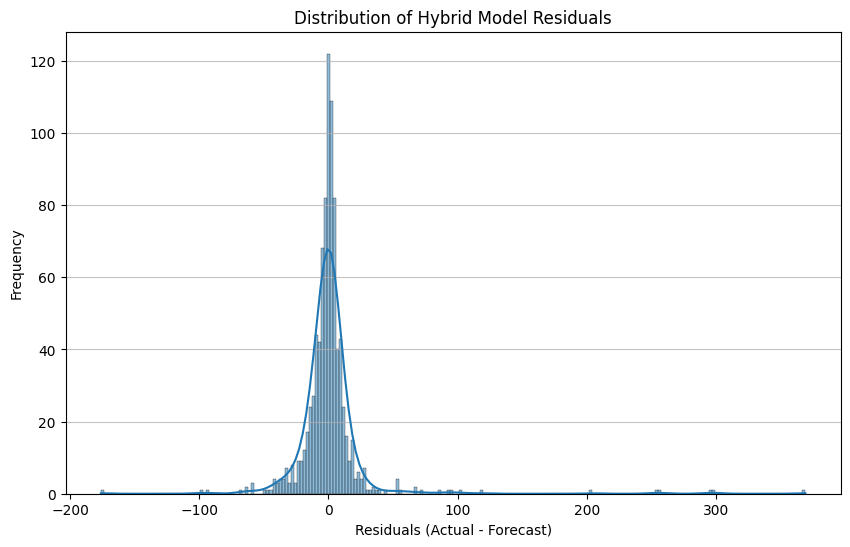

In [ ]:
# Plot a histogram of the residuals
plt.figure(figsize=(10, 6))
sns.histplot(all_hybrid_residuals_df['Residual'], kde=True)
plt.title('Distribution of Hybrid Model Residuals')
plt.xlabel('Residuals (Actual - Forecast)')
plt.ylabel('Frequency')
plt.grid(axis='y', alpha=0.75)
plt.show()

In [ ]:
# Calculate the total absolute residual volume for each item
total_absolute_residuals_by_item = all_hybrid_residuals_df.groupby('Item')['Residual'].apply(lambda x: abs(x).sum()).reset_index(name='Total_Absolute_Residual')

# Find the item with the largest total absolute residual
top_item_largest_residual = total_absolute_residuals_by_item.loc[total_absolute_residuals_by_item['Total_Absolute_Residual'].idxmax()]

# Display the result
print("\nItem with the largest total absolute residual volume:")
display(top_item_largest_residual)


Item with the largest total absolute residual volume:


,30
Item,Prod144
Total_Absolute_Residual,1910.768655


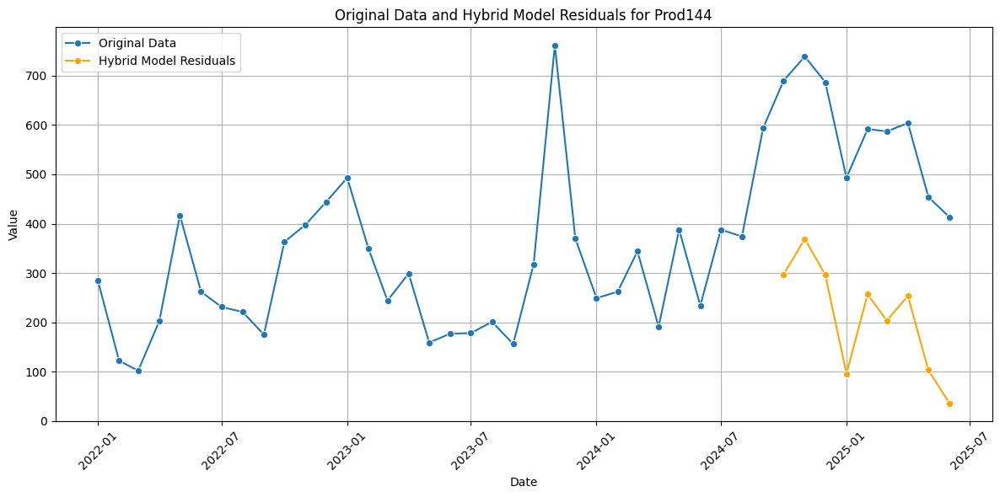

In [ ]:
# Filter original data for Prod144
prod144_original_data = selected_items_df[selected_items_df['Item'] == 'Prod144'].copy()

# Filter hybrid model residuals for Prod144
prod144_residuals = all_hybrid_residuals_df[all_hybrid_residuals_df['Item'] == 'Prod144'].copy()

# Create the plot
plt.figure(figsize=(12, 6))

# Plot original data
sns.lineplot(data=prod144_original_data, x='PDay', y='QtyOrd', label='Original Data', marker='o')

# Plot residuals
sns.lineplot(data=prod144_residuals, x='PDay', y='Residual', label='Hybrid Model Residuals', marker='o', color='orange')

plt.title('Original Data and Hybrid Model Residuals for Prod144')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Data Export section

In [ ]:
# To export CSV files to local Google Drive;
# Currently placed under markdown to avoid accidential override previous exported files
# This section is to be run on Google Colab with permission grant by user (Developer) Google Drive

from google.colab import drive
import pandas as pd
import os

# Mount Google Drive (if not already mounted)
try:
    drive.mount('/content/drive')
except:
    print("Google Drive already mounted or could not be mounted.")


def export_dataframes_to_drive(dataframes_dict, base_path='/content/drive/MyDrive/Exported_Dataframes'):

    # Create the base directory if it doesn't exist
    os.makedirs(base_path, exist_ok=True)

    for name, df in dataframes_dict.items():
        file_path = os.path.join(base_path, f"{name}.csv")
        try:
            df.to_csv(file_path, index=False)
            print(f"DataFrame '{name}' successfully exported to {file_path}")
        except Exception as e:
            print(f"Error exporting DataFrame '{name}': {e}")

dataframes_to_export = {
    'ETS_results': ETS_results,
    'auto_arima_results': auto_arima_results,
    'hybrid_df': hybrid_df,
    'holt_winters_results': holt_winters_results,
    'time_series_analysis_df': time_series_analysis_df,
    'selected_items_df': selected_items_df,
    'truncated_company_data': truncated_company_data,
    'company_data': company_data,
    'company_data_treated': company_data_treated,
    'shap_values_df': shap_values_df,
    'baseline_results_df': baseline_results_df,
    'combined_forecasts_df': combined_forecasts_df,
    'combined_metrics_df': combined_metrics_df,
    'test_predictions_df': test_predictions_df,
    'best_model_ranked': combined_best_model_counts_ranked
    #'arima_garch_df': arima_garch_results
}

# Call the function to export the dataframes
export_dataframes_to_drive(dataframes_to_export)

# Call the function to export the dataframes
export_dataframes_to_drive(dataframes_to_export)



Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
DataFrame 'ETS_results' successfully exported to /content/drive/MyDrive/Exported_Dataframes/ETS_results.csv
DataFrame 'auto_arima_results' successfully exported to /content/drive/MyDrive/Exported_Dataframes/auto_arima_results.csv
DataFrame 'hybrid_df' successfully exported to /content/drive/MyDrive/Exported_Dataframes/hybrid_df.csv
DataFrame 'holt_winters_results' successfully exported to /content/drive/MyDrive/Exported_Dataframes/holt_winters_results.csv
DataFrame 'time_series_analysis_df' successfully exported to /content/drive/MyDrive/Exported_Dataframes/time_series_analysis_df.csv
DataFrame 'selected_items_df' successfully exported to /content/drive/MyDrive/Exported_Dataframes/selected_items_df.csv
DataFrame 'truncated_company_data' successfully exported to /content/drive/MyDrive/Exported_Dataframes/truncated_company_data.csv
DataFrame 'company_data' succ